In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import datetime   
from datetime import date
from dateutil.relativ
\edelta import relativedelta
import ast
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import precision_score, recall_score, f1_score

df = pd.read_csv("ckd-dataset-v2-cleaned.csv")
df

,bp (Diastolic),bp limit,sg,al,rbc,su,pc,pcc,ba,bgr,...,dm,cad,appet,pe,ane,grf,stage,affected,age,class
0,0,0,0,3,0,0,0,0,0,1,...,0,0,0,0,0,9,0,1,8,1
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,9,0,1,8,1
2,0,0,1,4,1,0,1,0,1,1,...,0,0,1,0,0,5,0,1,8,1
3,1,1,1,2,0,0,0,0,0,0,...,0,0,0,0,0,5,0,1,8,1
4,0,0,3,0,0,0,0,0,0,3,...,1,0,1,1,0,5,0,1,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1,2,0,0,0,0,0,0,0,3,...,1,0,0,0,1,1,4,1,7,1
196,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,1,7,1
197,1,1,2,0,0,0,0,0,0,1,...,0,0,0,0,0,2,2,0,7,0
198,1,1,2,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,7,0


In [26]:

import seaborn as sns

#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(300,220))
font_size = 160
plt.tick_params(axis='both', labelsize=150, rotation= 35)

#plot heat map
g=sns.heatmap(round(df[top_corr_features].corr(),2), annot=True, cmap="RdYlGn", annot_kws={"size": font_size})


In [152]:
# removing affected column which is technically 'class'
df.pop('affected')

0      1
1      1
2      1
3      1
4      1
      ..
195    1
196    1
197    0
198    0
199    1
Name: affected, Length: 200, dtype: int64

In [153]:
list(df.columns)

['bp (Diastolic)',
 'bp limit',
 'sg',
 'al',
 'rbc',
 'su',
 'pc',
 'pcc',
 'ba',
 'bgr',
 'bu',
 'sod',
 'sc',
 'pot',
 'hemo',
 'pcv',
 'rbcc',
 'wbcc',
 'htn',
 'dm',
 'cad',
 'appet',
 'pe',
 'ane',
 'grf',
 'stage',
 'age',
 'class']

In [154]:
X = df.iloc[:,0:df.shape[1]-1]  #independent columns
y = df.iloc[:,-1]

In [155]:
X

,bp (Diastolic),bp limit,sg,al,rbc,su,pc,pcc,ba,bgr,...,wbcc,htn,dm,cad,appet,pe,ane,grf,stage,age
0,0,0,0,3,0,0,0,0,0,1,...,0,0,0,0,0,0,0,9,0,8
1,0,0,1,0,0,0,0,0,0,0,...,4,0,0,0,0,0,0,9,0,8
2,0,0,1,4,1,0,1,0,1,1,...,5,0,0,0,1,0,0,5,0,8
3,1,1,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,5,0,8
4,0,0,3,0,0,0,0,0,0,3,...,0,0,1,0,1,1,0,5,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1,2,0,0,0,0,0,0,0,3,...,0,1,1,0,0,0,1,1,4,7
196,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,7
197,1,1,2,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,2,2,7
198,1,1,2,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,4,0,7


In [156]:
y.value_counts()

class
1    128
0     72
Name: count, dtype: int64

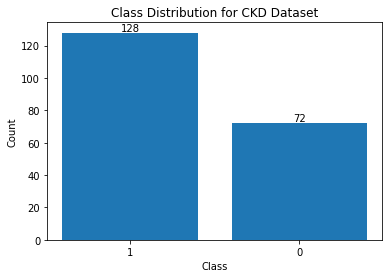

In [157]:
import matplotlib.pyplot as plt

# Data
d = {'1': 128, '0': 72}

# Plotting the bar chart
plt.bar(d.keys(), d.values())  # You can customize colors if needed

# Adding labels above each bar
for key, value in d.items():
    plt.text(key, value , str(value), ha='center', va='bottom')

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution for CKD Dataset')
plt.show()


In [158]:
y

0      1
1      1
2      1
3      1
4      1
      ..
195    1
196    1
197    0
198    0
199    1
Name: class, Length: 200, dtype: int64

In [25]:
# Feature Selection with Univariate Statistical Tests
from pandas import read_csv
from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

test = SelectKBest(score_func=f_classif, k=4)
fit = test.fit(X, y)
# summarize scores
set_printoptions(precision=3)
print(fit.scores_)
features = fit.transform(X)
# summarize selected features
print(features[0:5,:])


[2.081e+00 1.646e+01 5.735e+00 8.205e+01 1.730e+01 1.645e+01 3.865e+01
 1.906e+01 6.702e+00 2.768e+01 4.424e+01 2.256e-01 2.041e+01 1.461e+00
 1.756e+01 1.426e-04 2.335e+00 3.053e+00 1.112e+02 8.603e+01 1.479e+01
 3.240e+01 2.683e+01 2.376e+01 1.144e+02 8.192e+01 6.530e+00]
[[3 0 0 9]
 [0 0 0 9]
 [4 0 0 5]
 [2 0 0 5]
 [0 0 1 5]]


In [26]:
a = fit.scores_

b = list(X.columns)
d = {}
for i in range(len(b)):
    d[b[i]] = a[i]
print(d)
import operator
cd = sorted(d.items(),key=operator.itemgetter(1),reverse=True)
cd


{'bp (Diastolic)': 2.0813842785507504, 'bp limit': 16.46138021516663, 'sg': 5.7353226887111335, 'al': 82.05186034392915, 'rbc': 17.300970873786408, 'su': 16.449230769230766, 'pc': 38.64578313253012, 'pcc': 19.055049504950492, 'ba': 6.701538461538462, 'bgr': 27.684861490783096, 'bu': 44.24269171090241, 'sod': 0.22561710547461988, 'sc': 20.41478041393236, 'pot': 1.4613211845102507, 'hemo': 17.564864803903962, 'pcv': 0.00014257579741494975, 'rbcc': 2.334985210806441, 'wbcc': 3.0533596170092925, 'htn': 111.1968, 'dm': 86.02758620689656, 'cad': 14.793962264150943, 'appet': 32.4, 'pe': 26.825806451612905, 'ane': 23.759999999999998, 'grf': 114.36881282845981, 'stage': 81.91724452754136, 'age': 6.530352698698995}


[('grf', 114.36881282845981),
 ('htn', 111.1968),
 ('dm', 86.02758620689656),
 ('al', 82.05186034392915),
 ('stage', 81.91724452754136),
 ('bu', 44.24269171090241),
 ('pc', 38.64578313253012),
 ('appet', 32.4),
 ('bgr', 27.684861490783096),
 ('pe', 26.825806451612905),
 ('ane', 23.759999999999998),
 ('sc', 20.41478041393236),
 ('pcc', 19.055049504950492),
 ('hemo', 17.564864803903962),
 ('rbc', 17.300970873786408),
 ('bp limit', 16.46138021516663),
 ('su', 16.449230769230766),
 ('cad', 14.793962264150943),
 ('ba', 6.701538461538462),
 ('age', 6.530352698698995),
 ('sg', 5.7353226887111335),
 ('wbcc', 3.0533596170092925),
 ('rbcc', 2.334985210806441),
 ('bp (Diastolic)', 2.0813842785507504),
 ('pot', 1.4613211845102507),
 ('sod', 0.22561710547461988),
 ('pcv', 0.00014257579741494975)]

[0.006 0.042 0.036 0.098 0.008 0.015 0.037 0.007 0.001 0.022 0.033 0.015
 0.011 0.    0.085 0.019 0.02  0.012 0.147 0.127 0.004 0.039 0.02  0.015
 0.072 0.093 0.015]


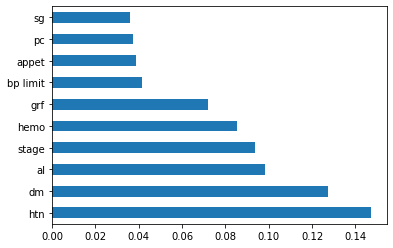

In [27]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [28]:
a = model.feature_importances_
b = list(X.columns)
d = {}
for i in range(len(b)):
    d[b[i]] = a[i]
#print(d)
import operator
cd = sorted(d.items(),key=operator.itemgetter(1),reverse=True)
cd

[('htn', 0.1471120414805346),
 ('dm', 0.1273067385086988),
 ('al', 0.09828855929446743),
 ('stage', 0.09349668854858244),
 ('hemo', 0.0853861090270816),
 ('grf', 0.07209095535907235),
 ('bp limit', 0.04176334410671898),
 ('appet', 0.038621640971992034),
 ('pc', 0.03717409954790137),
 ('sg', 0.0362166446205055),
 ('bu', 0.03286515383409058),
 ('bgr', 0.022189680230307034),
 ('rbcc', 0.020422113853016722),
 ('pe', 0.019808768938406357),
 ('pcv', 0.01933046130984525),
 ('age', 0.015101803708358844),
 ('su', 0.014888249530043482),
 ('ane', 0.014730323289938455),
 ('sod', 0.014574523499683826),
 ('wbcc', 0.01160676376532733),
 ('sc', 0.010930866870656725),
 ('rbc', 0.008164561234773219),
 ('pcc', 0.007046140775824326),
 ('bp (Diastolic)', 0.006246314498341157),
 ('cad', 0.0038160183221627206),
 ('ba', 0.0008214348736690205),
 ('pot', 0.0)]

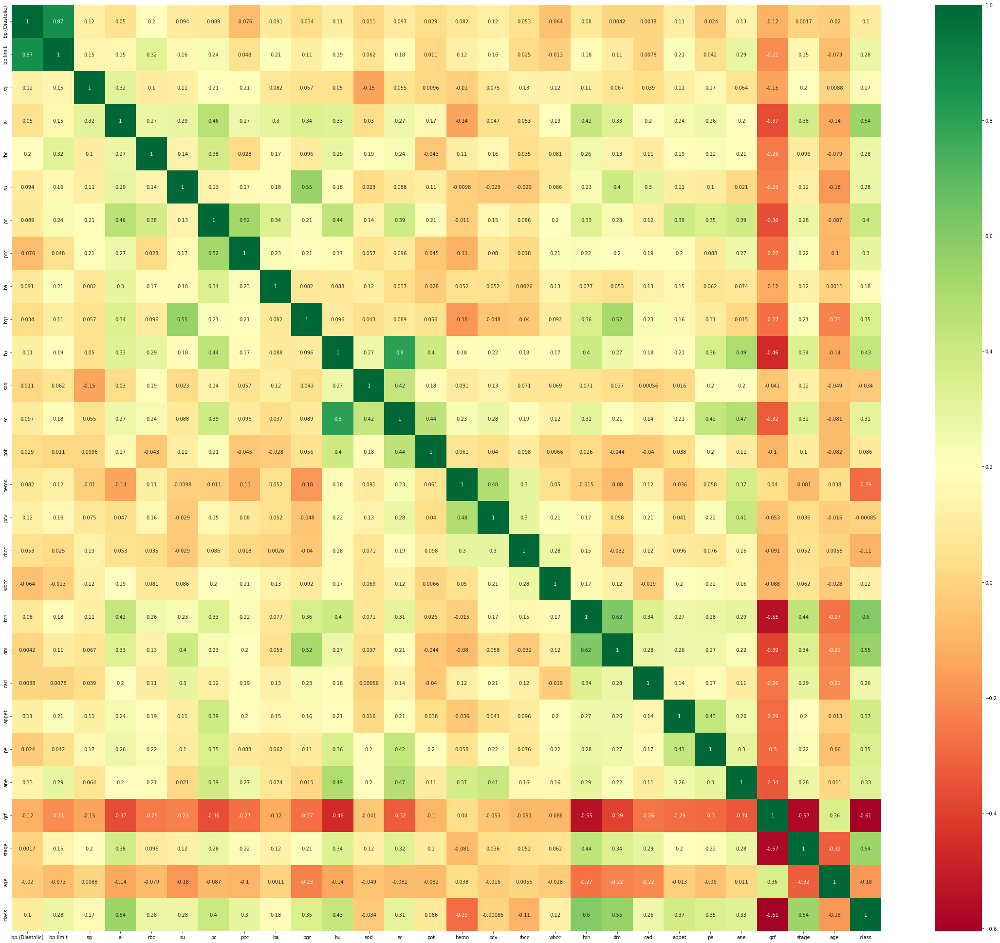

In [29]:
import seaborn as sns

#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(40,35))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [30]:
# column_names = ['hemo','al','htn','dm','cad','rbc','pc','bgr','appet','pe','ckd']
# m_data = data.reindex(columns=column_names)
# m_data.head()

# # 'sg','pcv',

In [159]:
# df=m_data
# df
df

,bp (Diastolic),bp limit,sg,al,rbc,su,pc,pcc,ba,bgr,...,htn,dm,cad,appet,pe,ane,grf,stage,age,class
0,0,0,0,3,0,0,0,0,0,1,...,0,0,0,0,0,0,9,0,8,1
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,9,0,8,1
2,0,0,1,4,1,0,1,0,1,1,...,0,0,0,1,0,0,5,0,8,1
3,1,1,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,5,0,8,1
4,0,0,3,0,0,0,0,0,0,3,...,0,1,0,1,1,0,5,0,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1,2,0,0,0,0,0,0,0,3,...,1,1,0,0,0,1,1,4,7,1
196,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,7,1
197,1,1,2,0,0,0,0,0,0,1,...,0,0,0,0,0,0,2,2,7,0
198,1,1,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,4,0,7,0


In [160]:
inputs = df.drop(['class'],axis='columns')

inputs

,bp (Diastolic),bp limit,sg,al,rbc,su,pc,pcc,ba,bgr,...,wbcc,htn,dm,cad,appet,pe,ane,grf,stage,age
0,0,0,0,3,0,0,0,0,0,1,...,0,0,0,0,0,0,0,9,0,8
1,0,0,1,0,0,0,0,0,0,0,...,4,0,0,0,0,0,0,9,0,8
2,0,0,1,4,1,0,1,0,1,1,...,5,0,0,0,1,0,0,5,0,8
3,1,1,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,5,0,8
4,0,0,3,0,0,0,0,0,0,3,...,0,0,1,0,1,1,0,5,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1,2,0,0,0,0,0,0,0,3,...,0,1,1,0,0,0,1,1,4,7
196,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,7
197,1,1,2,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,2,2,7
198,1,1,2,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,4,0,7


In [161]:
target = df['class']
target

0      1
1      1
2      1
3      1
4      1
      ..
195    1
196    1
197    0
198    0
199    1
Name: class, Length: 200, dtype: int64

In [250]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(inputs,target,test_size=0.2)

In [251]:
from sklearn import tree
model = tree.DecisionTreeClassifier()
model.fit(X_train,y_train)
model.score(X_test,y_test)


0.9

In [252]:

y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print('precision', precision)
print ('recal',recall)
print('f1_score', f1)

precision 0.9523809523809523
recal 0.8695652173913043
f1_score 0.909090909090909


              precision    recall  f1-score   support

           0       0.84      0.94      0.89        17
           1       0.95      0.87      0.91        23

    accuracy                           0.90        40
   macro avg       0.90      0.91      0.90        40
weighted avg       0.91      0.90      0.90        40



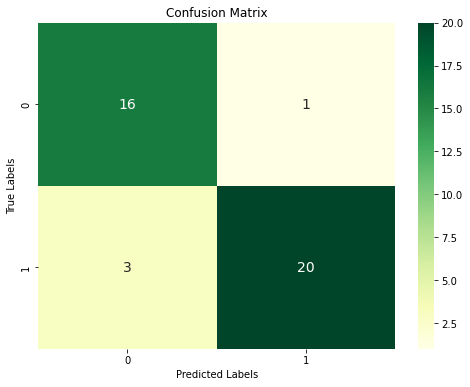

In [253]:
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [254]:
from sklearn.model_selection import cross_val_score
from statistics import mean
scores = cross_val_score(model, inputs, target, cv=10)
print(scores)

print(mean(scores))

[0.7  0.75 0.9  0.85 0.95 0.9  0.95 0.95 0.9  0.75]
0.86


R^2 score: 0.90
MAE score: 0.03
EVS score: 0.90


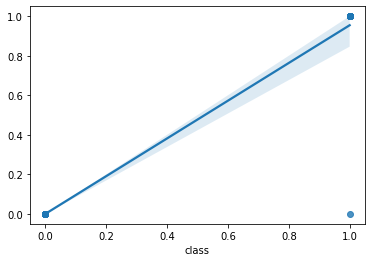

In [38]:
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error
import seaborn as sns
predictions  = model.predict(X_test)
print(f'R^2 score: {r2_score(y_true=y_test, y_pred=predictions):.2f}')
print(f'MAE score: {mean_absolute_error(y_true=y_test, y_pred=predictions):.2f}')
print(f'EVS score: {explained_variance_score(y_true=y_test, y_pred=predictions):.2f}')
rp = sns.regplot(x=y_test, y=predictions)

In [255]:
from sklearn.metrics import roc_auc_score
pred_prob1 = model.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9053708439897697


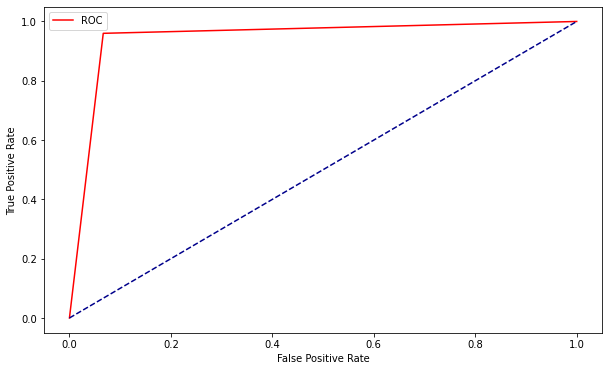

In [176]:
from sklearn.metrics import roc_curve,roc_auc_score
fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [190]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(inputs,target,test_size=0.2)
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
model.predict(X_test)
model.score(X_test,y_test)

0.85

In [191]:

y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print('precision', precision)
print ('recal',recall)
print('f1_score', f1)

precision 0.8333333333333334
recal 0.9090909090909091
f1_score 0.8695652173913043


              precision    recall  f1-score   support

           0       0.88      0.78      0.82        18
           1       0.83      0.91      0.87        22

    accuracy                           0.85        40
   macro avg       0.85      0.84      0.85        40
weighted avg       0.85      0.85      0.85        40



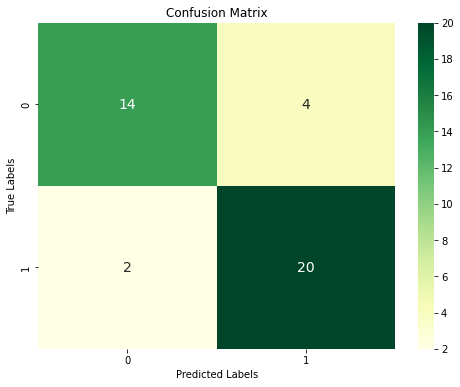

In [192]:
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [193]:
from sklearn.model_selection import cross_val_score
from statistics import mean
scores = cross_val_score(model, inputs, target, cv=10)
print(scores)

print(mean(scores))

[0.7  1.   0.95 0.9  0.95 0.9  1.   1.   1.   0.95]
0.9349999999999999


R^2 score: 0.80
MAE score: 0.05
EVS score: 0.81


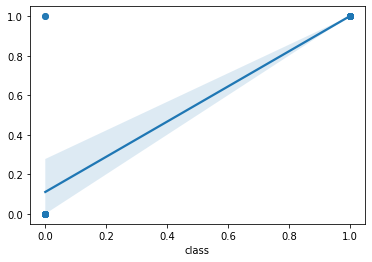

In [44]:
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error
import seaborn as sns
predictions  = model.predict(X_test)
print(f'R^2 score: {r2_score(y_true=y_test, y_pred=predictions):.2f}')
print(f'MAE score: {mean_absolute_error(y_true=y_test, y_pred=predictions):.2f}')
print(f'EVS score: {explained_variance_score(y_true=y_test, y_pred=predictions):.2f}')
rp = sns.regplot(x=y_test, y=predictions)

In [194]:
from sklearn.metrics import roc_auc_score
pred_prob1 = model.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9671717171717171


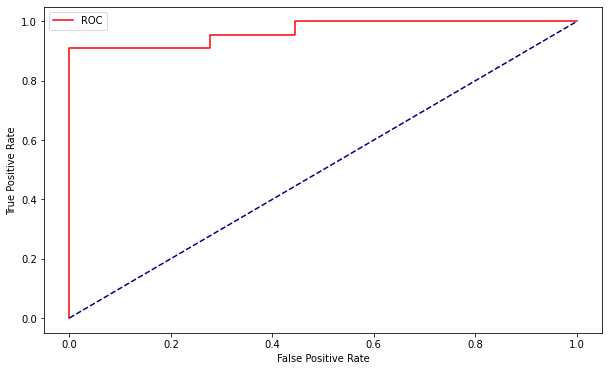

In [195]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

In [50]:
X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)
sc_X=StandardScaler()
#X_train=sc_X.fit_transform(X_train)
#X_test=sc_X.transform(X_test)
import math
math.sqrt(len(y_test))

6.324555320336759

In [51]:
model = KNeighborsClassifier(n_neighbors=8, p=2, metric='euclidean')
model.fit(X_train, y_train)
model.score(X_test,y_test)

0.85

              precision    recall  f1-score   support

           0       0.75      0.94      0.83        16
           1       0.95      0.79      0.86        24

    accuracy                           0.85        40
   macro avg       0.85      0.86      0.85        40
weighted avg       0.87      0.85      0.85        40



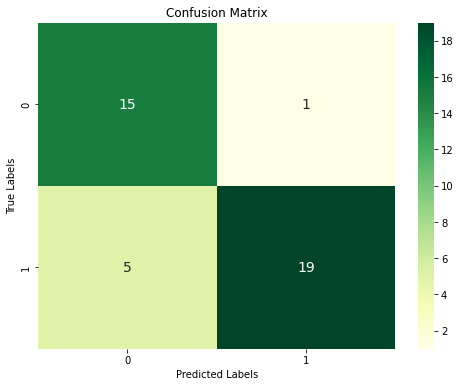

In [52]:
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [53]:
scores = cross_val_score(model, inputs, target, cv=10)
print(scores)

print(mean(scores))

[0.5  0.7  0.85 0.9  0.9  0.95 0.9  0.9  0.9  0.9 ]
0.84


R^2 score: 0.38
MAE score: 0.15
EVS score: 0.42


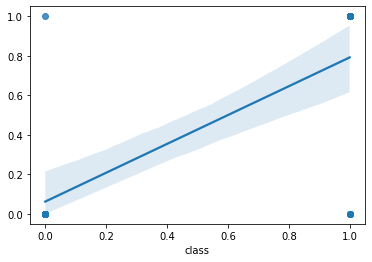

In [54]:
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error
import seaborn as sns
predictions  = model.predict(X_test)
print(f'R^2 score: {r2_score(y_true=y_test, y_pred=predictions):.2f}')
print(f'MAE score: {mean_absolute_error(y_true=y_test, y_pred=predictions):.2f}')
print(f'EVS score: {explained_variance_score(y_true=y_test, y_pred=predictions):.2f}')
rp = sns.regplot(x=y_test, y=predictions)

In [55]:
from sklearn.metrics import roc_auc_score
pred_prob1 = model.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.96484375


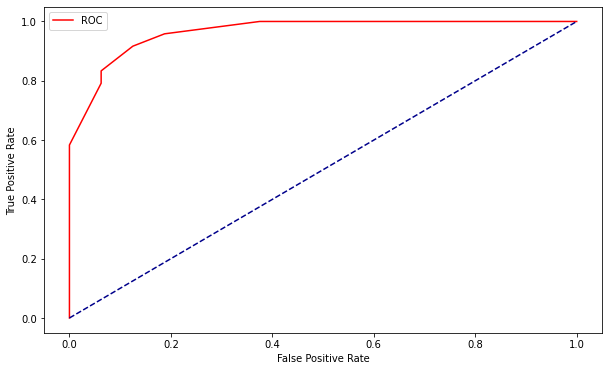

In [56]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [59]:

X_train, X_test, y_train, y_test = train_test_split(inputs,target,test_size=0.2)

import tensorflow as tf
from tensorflow import keras

input_shape = X_train.shape[1]

model = keras.Sequential([
    keras.layers.Dense(32, input_shape=(input_shape,), activation= 'relu'),
    keras.layers.Dense(32, input_shape=(input_shape,), activation= 'relu'),
    keras.layers.Dense(32, input_shape=(input_shape,), activation= 'relu'),
    keras.layers.Dense(32, input_shape=(input_shape,), activation= 'relu'),
    keras.layers.Dense(8, input_shape=(input_shape,), activation= 'relu'),
    keras.layers.Dense(1, activation= 'sigmoid'),
])

model.compile(optimizer='adam',
             loss='binary_crossentropy',
             metrics=['accuracy'])

model.fit(X_train, y_train, epochs=100)

Epoch 1/100
5/5 [==============================] - 1s 2ms/step - loss: 0.7325 - accuracy: 0.4250
Epoch 2/100
5/5 [==============================] - 0s 2ms/step - loss: 0.6577 - accuracy: 0.6875
Epoch 3/100
5/5 [==============================] - 0s 3ms/step - loss: 0.6110 - accuracy: 0.8125
Epoch 4/100
5/5 [==============================] - 0s 3ms/step - loss: 0.5670 - accuracy: 0.8188
Epoch 5/100
5/5 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.8813
Epoch 6/100
5/5 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.9000
Epoch 7/100
5/5 [==============================] - 0s 3ms/step - loss: 0.3940 - accuracy: 0.9250
Epoch 8/100
5/5 [==============================] - 0s 3ms/step - loss: 0.3271 - accuracy: 0.9438
Epoch 9/100
5/5 [==============================] - 0s 3ms/step - loss: 0.2698 - accuracy: 0.9312
Epoch 10/100
5/5 [==============================] - 0s 2ms/step - loss: 0.2174 - accuracy: 0.9500
Epoch 11/100
5/5 [===========

In [60]:
model.evaluate(X_test,y_test)

2/2 [==============================] - 0s 5ms/step - loss: 0.1671 - accuracy: 0.9500


[0.16709968447685242, 0.949999988079071]

In [61]:
# from sklearn.metrics import roc_curve,roc_auc_score
# y_val_cat_prob=model.predict_proba(X_test)
# auc_score=roc_auc_score(y_test,y_val_cat_prob)
# print(auc_score)

In [62]:
# from sklearn.metrics import confusion_matrix
# y_pred = model.predict(X_test)

# from sklearn.metrics import classification_report
# print(classification_report(y_test,y_pred))

# cm = confusion_matrix(y_test, y_pred)

# # Visualize the confusion matrix using seaborn heatmap
# plt.figure(figsize=(8, 6))
# sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
# plt.title('Confusion Matrix')
# plt.xlabel('Predicted Labels')
# plt.ylabel('True Labels')
# plt.show()

In [63]:
model

In [65]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)
model = RandomForestClassifier(random_state=10)
model.fit(X_train,y_train)
model.score(X_test,y_test)

0.95

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40



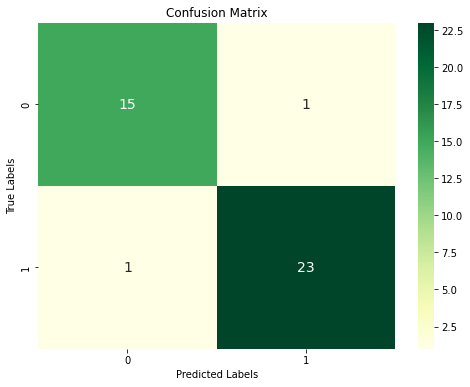

In [66]:
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [67]:
scores = cross_val_score(model, inputs, target, cv=10)
print(scores)

print(mean(scores))

[0.8  1.   1.   0.95 0.95 0.95 1.   0.95 1.   1.  ]
0.96


In [68]:
from sklearn.metrics import roc_auc_score
pred_prob1 = model.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9973958333333334


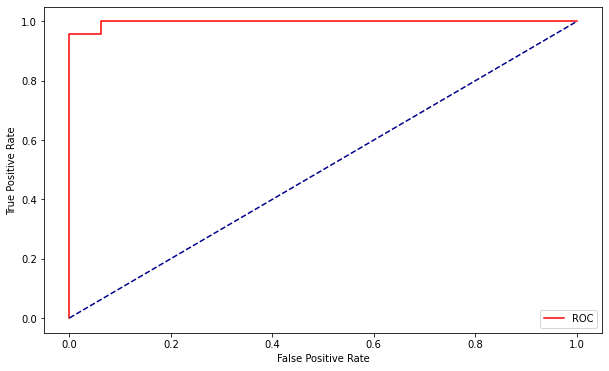

In [69]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [209]:
import xgboost as xgb
depth= 2
weight= 0.5
g = 1
X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)
model = xgb.XGBClassifier(objective="binary:logistic", random_state=0, 
                                                                  max_depth= depth,
                                                                  min_child_weight= weight,
                                                                  gamma = g)
model.fit(X_train,y_train)
model.score(X_test,y_test)


0.95

In [210]:

y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print('precision', precision)
print ('recal',recall)
print('f1_score', f1)

precision 0.9583333333333334
recal 0.9583333333333334
f1_score 0.9583333333333334


In [211]:
model

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=1, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=2, max_leaves=0, min_child_weight=0.5,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40



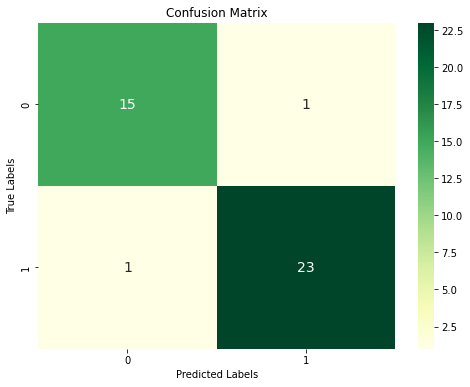

In [212]:
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [213]:
scores = cross_val_score(model, inputs, target, cv=10)
print(scores)

print(mean(scores))

[0.7  0.95 1.   0.85 1.   0.95 1.   1.   1.   1.  ]
0.945


In [214]:
from sklearn.metrics import roc_auc_score
pred_prob1 = model.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9895833333333334


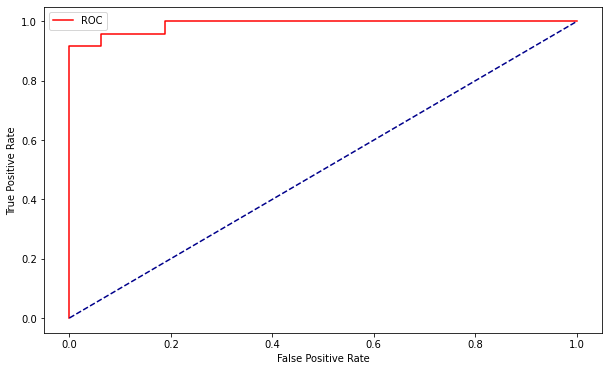

In [215]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [225]:
# Import necessary libraries
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
from sklearn.metrics import accuracy_score

# Initialize the MLPClassifier
# This example uses a simple MLP with one hidden layer containing 5 neurons
X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)
mlp = MLPClassifier(hidden_layer_sizes=(5,), max_iter=3000, random_state=42)


mlp.fit(X_train, y_train)

# Make predictions on the test set
y_pred = mlp.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.90


In [224]:
import optuna
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_digits

X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)

def objective(trial):
    # Define hyperparameters to optimize
    hidden_layer_sizes = [trial.suggest_int(f'layer_{i}_size', 1, 100) for i in range(trial.suggest_int('n_layers', 1, 3))]
    activation = trial.suggest_categorical('activation', ['relu', 'tanh', 'logistic'])
    alpha = trial.suggest_loguniform('alpha', 1e-5, 1e-1)

    # Create MLP classifier with suggested hyperparameters
    mlp = MLPClassifier(
        hidden_layer_sizes=hidden_layer_sizes,
        activation=activation,
        alpha=alpha,
        max_iter=1000  # You can adjust this based on your dataset and requirements
    )

    # Train the model
    mlp.fit(X_train, y_train)

    # Evaluate the model on the validation set
    y_pred = mlp.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)

    return 1 - accuracy  # Optuna minimizes the objective function, so we use 1 - accuracy

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters and their corresponding accuracy
best_params = study.best_params
best_accuracy = 1.0 - study.best_value

print(f"Best Hyperparameters: {best_params}")
print(f"Best Accuracy: {best_accuracy}")


[I 2024-02-25 05:00:50,722] A new study created in memory with name: no-name-33bd13c6-fdae-4137-b350-b5b14cbb49b7
[I 2024-02-25 05:00:50,899] Trial 0 finished with value: 0.07499999999999996 and parameters: {'n_layers': 2, 'layer_0_size': 31, 'layer_1_size': 100, 'activation': 'tanh', 'alpha': 0.0001364563314851656}. Best is trial 0 with value: 0.07499999999999996.
[I 2024-02-25 05:00:51,380] Trial 1 finished with value: 0.125 and parameters: {'n_layers': 3, 'layer_0_size': 55, 'layer_1_size': 71, 'layer_2_size': 40, 'activation': 'logistic', 'alpha': 1.7621276860938156e-05}. Best is trial 0 with value: 0.07499999999999996.
[I 2024-02-25 05:00:51,597] Trial 2 finished with value: 0.09999999999999998 and parameters: {'n_layers': 1, 'layer_0_size': 7, 'activation': 'tanh', 'alpha': 0.005897569915487545}. Best is trial 0 with value: 0.07499999999999996.
[I 2024-02-25 05:00:51,740] Trial 3 finished with value: 0.09999999999999998 and parameters: {'n_layers': 3, 'layer_0_size': 72, 'layer_1

[I 2024-02-25 05:00:57,307] Trial 34 finished with value: 0.050000000000000044 and parameters: {'n_layers': 1, 'layer_0_size': 68, 'activation': 'relu', 'alpha': 0.002617392731751152}. Best is trial 8 with value: 0.050000000000000044.
[I 2024-02-25 05:00:57,451] Trial 35 finished with value: 0.09999999999999998 and parameters: {'n_layers': 1, 'layer_0_size': 49, 'activation': 'relu', 'alpha': 0.0005950686355254008}. Best is trial 8 with value: 0.050000000000000044.
[I 2024-02-25 05:00:57,703] Trial 36 finished with value: 0.09999999999999998 and parameters: {'n_layers': 1, 'layer_0_size': 74, 'activation': 'logistic', 'alpha': 0.001554972569200969}. Best is trial 8 with value: 0.050000000000000044.
[I 2024-02-25 05:00:57,845] Trial 37 finished with value: 0.09999999999999998 and parameters: {'n_layers': 1, 'layer_0_size': 62, 'activation': 'relu', 'alpha': 0.004442574292124901}. Best is trial 8 with value: 0.050000000000000044.
[I 2024-02-25 05:00:58,097] Trial 38 finished with value: 

Best Hyperparameters: {'n_layers': 1, 'layer_0_size': 54, 'activation': 'relu', 'alpha': 0.0002815536802392026}
Best Accuracy: 0.95


In [72]:
# Best Hyperparameters: {'n_layers': 2, 'layer_0_size': 37, 'layer_1_size': 58, 'activation': 'tanh', 'alpha': 0.00012176827176055494}
# Best Accuracy: 1.0

Accuracy with Best Hyperparameters: 0.9500
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40

precision 0.9583333333333334
recal 0.9583333333333334
f1_score 0.9583333333333334


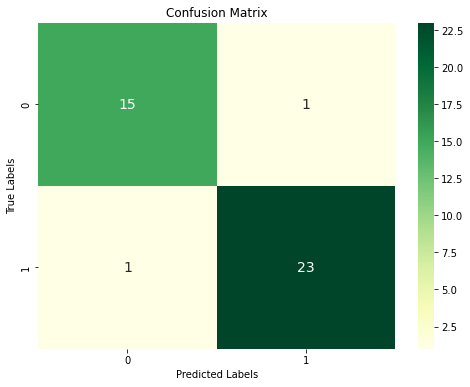

Accuracy with Best Hyperparameters: 0.9500
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40

precision 0.9583333333333334
recal 0.9583333333333334
f1_score 0.9583333333333334


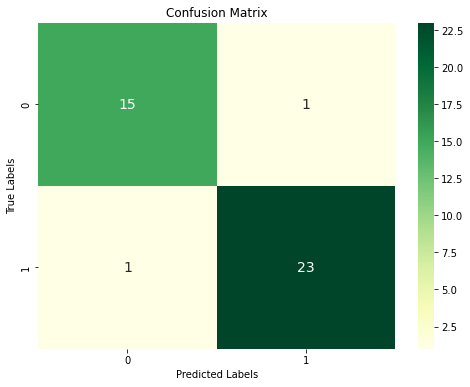

Accuracy with Best Hyperparameters: 0.9500
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40

precision 0.9583333333333334
recal 0.9583333333333334
f1_score 0.9583333333333334


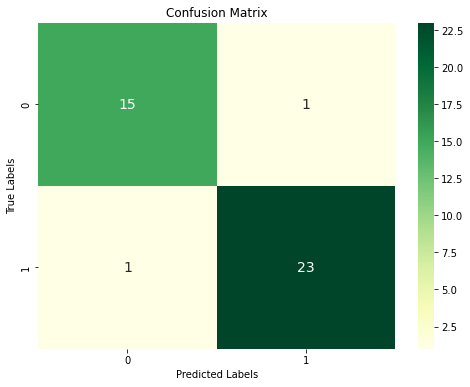

Accuracy with Best Hyperparameters: 0.9500
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40

precision 0.9583333333333334
recal 0.9583333333333334
f1_score 0.9583333333333334


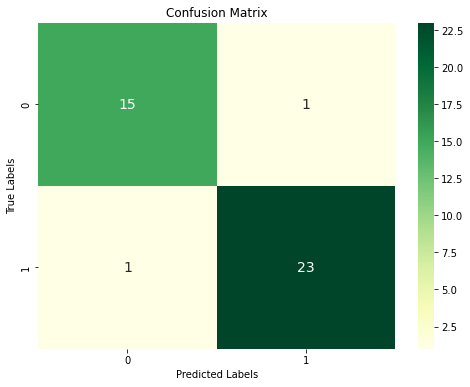

Accuracy with Best Hyperparameters: 0.9250
              precision    recall  f1-score   support

           0       0.88      0.94      0.91        16
           1       0.96      0.92      0.94        24

    accuracy                           0.93        40
   macro avg       0.92      0.93      0.92        40
weighted avg       0.93      0.93      0.93        40

precision 0.9565217391304348
recal 0.9166666666666666
f1_score 0.9361702127659574


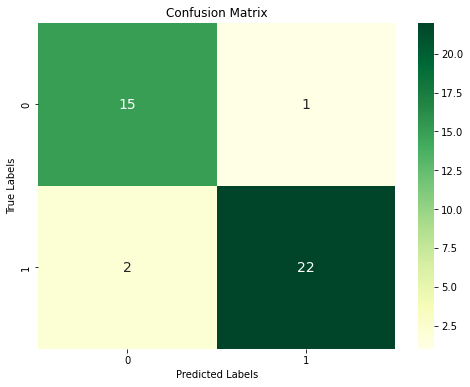

In [232]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
for i in range(40):
# Best hyperparameters obtained from Optuna
    best_hyperparameters=  {'n_layers': 1, 'layer_0_size': 36, 'activation': 'relu', 'alpha': 0.0817564373110177}

    # Extract hyperparameters
    n_layers = best_hyperparameters['n_layers']
    hidden_layer_sizes = [best_hyperparameters[f'layer_{i}_size'] for i in range(n_layers)]
    activation = best_hyperparameters['activation']
    alpha = best_hyperparameters['alpha']

    # Create MLP classifier with best hyperparameters
    mlp_classifier = MLPClassifier(
        hidden_layer_sizes=hidden_layer_sizes,
        activation=activation,
        alpha=alpha,
        max_iter=1000  # You can adjust this based on your dataset and requirements
    )

    # Train the model
    mlp_classifier.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = mlp_classifier.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)

    print(f"Accuracy with Best Hyperparameters: {accuracy:.4f}")
    
    from sklearn.metrics import confusion_matrix
    y_pred = mlp_classifier.predict(X_test)

    from sklearn.metrics import classification_report
    print(classification_report(y_test,y_pred))
    
    
    y_pred = mlp_classifier.predict(X_test)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    print('precision', precision)
    print ('recal',recall)
    print('f1_score', f1)
    cm = confusion_matrix(y_test, y_pred)

    # Visualize the confusion matrix using seaborn heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()
    if accuracy == 0.9250:
        break
    
   


In [233]:
mlp_classifier

MLPClassifier(alpha=0.0817564373110177, hidden_layer_sizes=[36], max_iter=1000)

precision 0.9565217391304348
recal 0.9166666666666666
f1_score 0.9361702127659574
              precision    recall  f1-score   support

           0       0.88      0.94      0.91        16
           1       0.96      0.92      0.94        24

    accuracy                           0.93        40
   macro avg       0.92      0.93      0.92        40
weighted avg       0.93      0.93      0.93        40



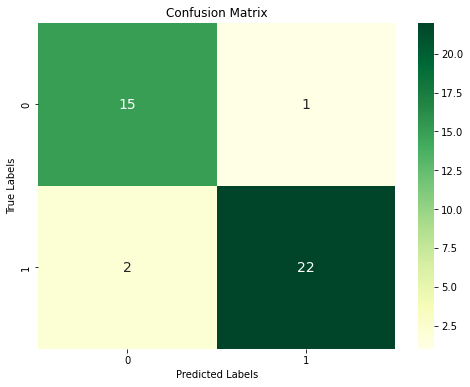

In [234]:
from sklearn.metrics import confusion_matrix
y_pred = mlp_classifier.predict(X_test)


precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print('precision', precision)
print ('recal',recall)
print('f1_score', f1)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [235]:
scores = cross_val_score(mlp_classifier, inputs, target, cv=10)
print(scores)

print(mean(scores))

[0.7  1.   0.9  0.95 1.   0.9  1.   1.   1.   0.95]
0.94


In [236]:
from sklearn.metrics import roc_auc_score
pred_prob1 = mlp_classifier.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9739583333333334


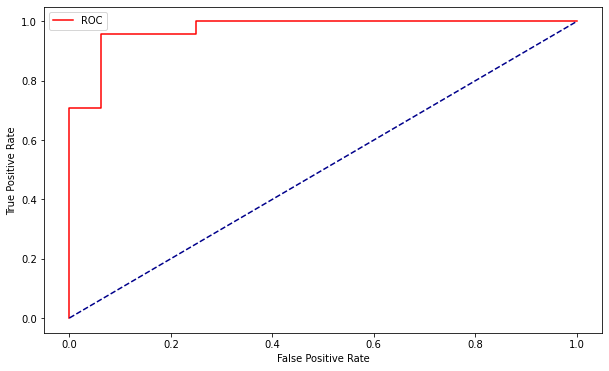

In [237]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [95]:
import lightgbm as lgb

for i in range(50):
    clf = lgb.LGBMClassifier()
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    print('accuracy',accuracy)
    if accuracy <=0.97:
        break
    


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 104, number of negative: 56
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 124
[LightGBM] [Info] Number of data points in the train set: 160, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.650000 -> initscore=0.619039
[LightGBM] [Info] Start training from score 0.619039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [96]:
clf

LGBMClassifier()

              precision    recall  f1-score   support

           0       0.88      0.94      0.91        16
           1       0.96      0.92      0.94        24

    accuracy                           0.93        40
   macro avg       0.92      0.93      0.92        40
weighted avg       0.93      0.93      0.93        40



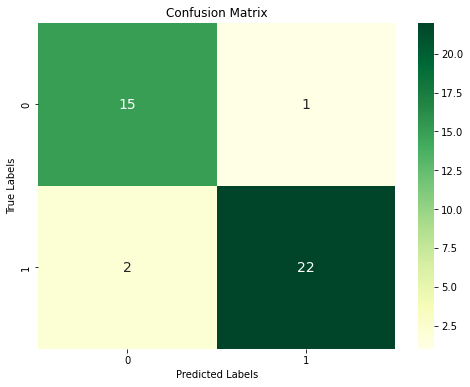

In [97]:
from sklearn.metrics import confusion_matrix
y_pred = clf.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [98]:
scores = cross_val_score(clf, inputs, target, cv=10)
print(scores)

print(mean(scores))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 115, number of negative: 65
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 180, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.638889 -> initscore=0.570545
[LightGBM] [Info] Start training from score 0.570545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [99]:
from sklearn.metrics import roc_auc_score
pred_prob1 = clf.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9921875


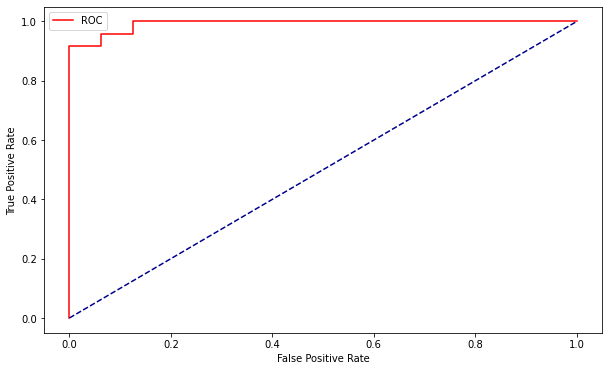

In [100]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [239]:
from catboost import CatBoostClassifier
X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)
catboost_model = CatBoostClassifier()

# Train the model
catboost_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = catboost_model.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'CatBoost Accuracy: {accuracy:.2f}')

Learning rate set to 0.004711
0:	learn: 0.6868201	total: 1.72ms	remaining: 1.72s
1:	learn: 0.6806031	total: 3.54ms	remaining: 1.77s
2:	learn: 0.6752279	total: 5.08ms	remaining: 1.69s
3:	learn: 0.6702404	total: 6.45ms	remaining: 1.61s
4:	learn: 0.6651893	total: 7.8ms	remaining: 1.55s
5:	learn: 0.6608867	total: 9.04ms	remaining: 1.5s
6:	learn: 0.6563890	total: 10.4ms	remaining: 1.47s
7:	learn: 0.6513741	total: 11.8ms	remaining: 1.47s
8:	learn: 0.6467638	total: 13.1ms	remaining: 1.44s
9:	learn: 0.6427214	total: 14.3ms	remaining: 1.42s
10:	learn: 0.6367940	total: 15.7ms	remaining: 1.41s
11:	learn: 0.6314655	total: 16.9ms	remaining: 1.4s
12:	learn: 0.6259507	total: 18ms	remaining: 1.36s
13:	learn: 0.6203364	total: 18.5ms	remaining: 1.3s
14:	learn: 0.6159359	total: 19.5ms	remaining: 1.28s
15:	learn: 0.6100045	total: 20.7ms	remaining: 1.27s
16:	learn: 0.6055596	total: 22.4ms	remaining: 1.29s
17:	learn: 0.6002069	total: 23.4ms	remaining: 1.28s
18:	learn: 0.5947095	total: 24.4ms	remaining: 1.26

187:	learn: 0.1992607	total: 174ms	remaining: 753ms
188:	learn: 0.1983268	total: 176ms	remaining: 753ms
189:	learn: 0.1976305	total: 177ms	remaining: 753ms
190:	learn: 0.1967088	total: 178ms	remaining: 753ms
191:	learn: 0.1954279	total: 179ms	remaining: 752ms
192:	learn: 0.1941822	total: 180ms	remaining: 751ms
193:	learn: 0.1932661	total: 181ms	remaining: 750ms
194:	learn: 0.1920623	total: 181ms	remaining: 748ms
195:	learn: 0.1910837	total: 182ms	remaining: 747ms
196:	learn: 0.1902530	total: 183ms	remaining: 745ms
197:	learn: 0.1890660	total: 184ms	remaining: 744ms
198:	learn: 0.1880270	total: 184ms	remaining: 742ms
199:	learn: 0.1872560	total: 185ms	remaining: 740ms
200:	learn: 0.1865645	total: 186ms	remaining: 739ms
201:	learn: 0.1856472	total: 187ms	remaining: 738ms
202:	learn: 0.1847320	total: 188ms	remaining: 738ms
203:	learn: 0.1834796	total: 189ms	remaining: 736ms
204:	learn: 0.1827883	total: 190ms	remaining: 735ms
205:	learn: 0.1817693	total: 190ms	remaining: 733ms
206:	learn: 

386:	learn: 0.0900622	total: 351ms	remaining: 557ms
387:	learn: 0.0898756	total: 353ms	remaining: 556ms
388:	learn: 0.0895919	total: 354ms	remaining: 555ms
389:	learn: 0.0892810	total: 355ms	remaining: 555ms
390:	learn: 0.0890451	total: 356ms	remaining: 554ms
391:	learn: 0.0887491	total: 357ms	remaining: 553ms
392:	learn: 0.0884595	total: 358ms	remaining: 552ms
393:	learn: 0.0882364	total: 358ms	remaining: 551ms
394:	learn: 0.0880307	total: 359ms	remaining: 550ms
395:	learn: 0.0877636	total: 360ms	remaining: 550ms
396:	learn: 0.0874078	total: 361ms	remaining: 549ms
397:	learn: 0.0871629	total: 362ms	remaining: 548ms
398:	learn: 0.0868144	total: 363ms	remaining: 547ms
399:	learn: 0.0865709	total: 363ms	remaining: 545ms
400:	learn: 0.0862839	total: 364ms	remaining: 544ms
401:	learn: 0.0860898	total: 365ms	remaining: 543ms
402:	learn: 0.0858131	total: 366ms	remaining: 542ms
403:	learn: 0.0854740	total: 367ms	remaining: 542ms
404:	learn: 0.0852255	total: 368ms	remaining: 541ms
405:	learn: 

719:	learn: 0.0395765	total: 643ms	remaining: 250ms
720:	learn: 0.0395030	total: 644ms	remaining: 249ms
721:	learn: 0.0394101	total: 645ms	remaining: 248ms
722:	learn: 0.0393413	total: 646ms	remaining: 248ms
723:	learn: 0.0392547	total: 647ms	remaining: 247ms
724:	learn: 0.0391667	total: 648ms	remaining: 246ms
725:	learn: 0.0390922	total: 649ms	remaining: 245ms
726:	learn: 0.0390082	total: 649ms	remaining: 244ms
727:	learn: 0.0389084	total: 650ms	remaining: 243ms
728:	learn: 0.0388020	total: 651ms	remaining: 242ms
729:	learn: 0.0387352	total: 652ms	remaining: 241ms
730:	learn: 0.0386411	total: 653ms	remaining: 240ms
731:	learn: 0.0385853	total: 653ms	remaining: 239ms
732:	learn: 0.0385112	total: 654ms	remaining: 238ms
733:	learn: 0.0384275	total: 655ms	remaining: 237ms
734:	learn: 0.0383571	total: 656ms	remaining: 236ms
735:	learn: 0.0383058	total: 657ms	remaining: 236ms
736:	learn: 0.0382173	total: 657ms	remaining: 235ms
737:	learn: 0.0381444	total: 658ms	remaining: 234ms
738:	learn: 

913:	learn: 0.0280349	total: 821ms	remaining: 77.2ms
914:	learn: 0.0279888	total: 822ms	remaining: 76.4ms
915:	learn: 0.0279406	total: 823ms	remaining: 75.5ms
916:	learn: 0.0278861	total: 824ms	remaining: 74.6ms
917:	learn: 0.0278302	total: 825ms	remaining: 73.7ms
918:	learn: 0.0278048	total: 826ms	remaining: 72.8ms
919:	learn: 0.0277746	total: 826ms	remaining: 71.9ms
920:	learn: 0.0277325	total: 827ms	remaining: 71ms
921:	learn: 0.0276920	total: 828ms	remaining: 70.1ms
922:	learn: 0.0276619	total: 829ms	remaining: 69.2ms
923:	learn: 0.0276275	total: 830ms	remaining: 68.3ms
924:	learn: 0.0275582	total: 831ms	remaining: 67.4ms
925:	learn: 0.0275148	total: 832ms	remaining: 66.4ms
926:	learn: 0.0274678	total: 832ms	remaining: 65.5ms
927:	learn: 0.0274181	total: 833ms	remaining: 64.6ms
928:	learn: 0.0273794	total: 834ms	remaining: 63.7ms
929:	learn: 0.0273383	total: 835ms	remaining: 62.8ms
930:	learn: 0.0273013	total: 836ms	remaining: 61.9ms
931:	learn: 0.0272557	total: 837ms	remaining: 61

In [240]:
y_pred = catboost_model.predict(X_test)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print('precision', precision)
print ('recal',recall)
print('f1_score', f1)

precision 0.9583333333333334
recal 0.9583333333333334
f1_score 0.9583333333333334


              precision    recall  f1-score   support

           0       0.94      0.94      0.94        16
           1       0.96      0.96      0.96        24

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40



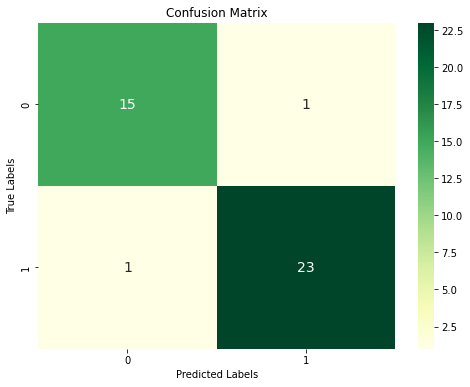

In [243]:
from sklearn.metrics import confusion_matrix


from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGn", annot_kws={"size": 14})
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [242]:
from sklearn.model_selection import cross_val_score
from statistics import mean
scores = cross_val_score(catboost_model, inputs, target, cv=10)
print(scores)

print(mean(scores))

Learning rate set to 0.004954
0:	learn: 0.6868265	total: 2.4ms	remaining: 2.4s
1:	learn: 0.6793016	total: 4.21ms	remaining: 2.1s
2:	learn: 0.6726122	total: 5.68ms	remaining: 1.89s
3:	learn: 0.6662274	total: 6.67ms	remaining: 1.66s
4:	learn: 0.6600625	total: 7.97ms	remaining: 1.58s
5:	learn: 0.6543929	total: 9.22ms	remaining: 1.53s
6:	learn: 0.6480698	total: 10.5ms	remaining: 1.49s
7:	learn: 0.6434560	total: 11.8ms	remaining: 1.47s
8:	learn: 0.6378103	total: 12.9ms	remaining: 1.43s
9:	learn: 0.6323630	total: 14.3ms	remaining: 1.42s
10:	learn: 0.6268083	total: 15.4ms	remaining: 1.39s
11:	learn: 0.6206615	total: 16.2ms	remaining: 1.33s
12:	learn: 0.6155846	total: 17.2ms	remaining: 1.3s
13:	learn: 0.6103259	total: 18.2ms	remaining: 1.28s
14:	learn: 0.6041984	total: 19.3ms	remaining: 1.27s
15:	learn: 0.5980114	total: 20.5ms	remaining: 1.26s
16:	learn: 0.5931913	total: 22.2ms	remaining: 1.28s
17:	learn: 0.5879270	total: 23.5ms	remaining: 1.28s
18:	learn: 0.5825037	total: 25ms	remaining: 1.29

187:	learn: 0.1785081	total: 176ms	remaining: 760ms
188:	learn: 0.1778917	total: 177ms	remaining: 759ms
189:	learn: 0.1772136	total: 178ms	remaining: 759ms
190:	learn: 0.1760037	total: 179ms	remaining: 758ms
191:	learn: 0.1750442	total: 180ms	remaining: 757ms
192:	learn: 0.1738625	total: 181ms	remaining: 757ms
193:	learn: 0.1725840	total: 182ms	remaining: 756ms
194:	learn: 0.1715918	total: 183ms	remaining: 755ms
195:	learn: 0.1705752	total: 184ms	remaining: 754ms
196:	learn: 0.1697358	total: 185ms	remaining: 753ms
197:	learn: 0.1689398	total: 186ms	remaining: 751ms
198:	learn: 0.1681664	total: 186ms	remaining: 751ms
199:	learn: 0.1674938	total: 187ms	remaining: 749ms
200:	learn: 0.1664766	total: 188ms	remaining: 748ms
201:	learn: 0.1657431	total: 189ms	remaining: 746ms
202:	learn: 0.1648660	total: 190ms	remaining: 745ms
203:	learn: 0.1640467	total: 191ms	remaining: 744ms
204:	learn: 0.1633491	total: 192ms	remaining: 743ms
205:	learn: 0.1624546	total: 193ms	remaining: 742ms
206:	learn: 

387:	learn: 0.0805227	total: 353ms	remaining: 556ms
388:	learn: 0.0802846	total: 353ms	remaining: 555ms
389:	learn: 0.0800744	total: 355ms	remaining: 555ms
390:	learn: 0.0797865	total: 355ms	remaining: 554ms
391:	learn: 0.0796224	total: 356ms	remaining: 553ms
392:	learn: 0.0793191	total: 357ms	remaining: 552ms
393:	learn: 0.0791263	total: 358ms	remaining: 551ms
394:	learn: 0.0789553	total: 359ms	remaining: 550ms
395:	learn: 0.0787078	total: 360ms	remaining: 549ms
396:	learn: 0.0785389	total: 361ms	remaining: 548ms
397:	learn: 0.0782811	total: 362ms	remaining: 547ms
398:	learn: 0.0780853	total: 363ms	remaining: 546ms
399:	learn: 0.0778946	total: 364ms	remaining: 546ms
400:	learn: 0.0777428	total: 365ms	remaining: 545ms
401:	learn: 0.0774572	total: 365ms	remaining: 544ms
402:	learn: 0.0772014	total: 366ms	remaining: 543ms
403:	learn: 0.0768634	total: 367ms	remaining: 542ms
404:	learn: 0.0765817	total: 368ms	remaining: 541ms
405:	learn: 0.0763642	total: 369ms	remaining: 540ms
406:	learn: 

599:	learn: 0.0468403	total: 532ms	remaining: 355ms
600:	learn: 0.0467152	total: 533ms	remaining: 354ms
601:	learn: 0.0466223	total: 534ms	remaining: 353ms
602:	learn: 0.0465194	total: 535ms	remaining: 353ms
603:	learn: 0.0463850	total: 536ms	remaining: 352ms
604:	learn: 0.0462960	total: 537ms	remaining: 351ms
605:	learn: 0.0462054	total: 538ms	remaining: 350ms
606:	learn: 0.0461229	total: 539ms	remaining: 349ms
607:	learn: 0.0460125	total: 540ms	remaining: 348ms
608:	learn: 0.0459102	total: 541ms	remaining: 348ms
609:	learn: 0.0457855	total: 542ms	remaining: 347ms
610:	learn: 0.0456751	total: 543ms	remaining: 346ms
611:	learn: 0.0455375	total: 544ms	remaining: 345ms
612:	learn: 0.0454364	total: 545ms	remaining: 344ms
613:	learn: 0.0453732	total: 546ms	remaining: 343ms
614:	learn: 0.0452732	total: 547ms	remaining: 343ms
615:	learn: 0.0451928	total: 548ms	remaining: 342ms
616:	learn: 0.0450987	total: 549ms	remaining: 341ms
617:	learn: 0.0450187	total: 550ms	remaining: 340ms
618:	learn: 

806:	learn: 0.0314274	total: 710ms	remaining: 170ms
807:	learn: 0.0313698	total: 712ms	remaining: 169ms
808:	learn: 0.0313049	total: 713ms	remaining: 168ms
809:	learn: 0.0312471	total: 713ms	remaining: 167ms
810:	learn: 0.0311860	total: 714ms	remaining: 166ms
811:	learn: 0.0311376	total: 715ms	remaining: 166ms
812:	learn: 0.0310655	total: 716ms	remaining: 165ms
813:	learn: 0.0310018	total: 717ms	remaining: 164ms
814:	learn: 0.0309493	total: 718ms	remaining: 163ms
815:	learn: 0.0309132	total: 719ms	remaining: 162ms
816:	learn: 0.0308343	total: 720ms	remaining: 161ms
817:	learn: 0.0307884	total: 721ms	remaining: 160ms
818:	learn: 0.0307274	total: 722ms	remaining: 159ms
819:	learn: 0.0306662	total: 722ms	remaining: 159ms
820:	learn: 0.0306193	total: 723ms	remaining: 158ms
821:	learn: 0.0305501	total: 724ms	remaining: 157ms
822:	learn: 0.0304988	total: 725ms	remaining: 156ms
823:	learn: 0.0304478	total: 726ms	remaining: 155ms
824:	learn: 0.0304129	total: 727ms	remaining: 154ms
825:	learn: 

Learning rate set to 0.004954
0:	learn: 0.6875575	total: 841us	remaining: 841ms
1:	learn: 0.6804306	total: 1.72ms	remaining: 859ms
2:	learn: 0.6759578	total: 2.57ms	remaining: 854ms
3:	learn: 0.6695405	total: 3.44ms	remaining: 856ms
4:	learn: 0.6635720	total: 4.42ms	remaining: 880ms
5:	learn: 0.6570324	total: 5.33ms	remaining: 882ms
6:	learn: 0.6512240	total: 6.22ms	remaining: 882ms
7:	learn: 0.6446324	total: 7.18ms	remaining: 890ms
8:	learn: 0.6398257	total: 8.14ms	remaining: 897ms
9:	learn: 0.6342585	total: 9.14ms	remaining: 905ms
10:	learn: 0.6289413	total: 10.2ms	remaining: 919ms
11:	learn: 0.6249534	total: 11.2ms	remaining: 925ms
12:	learn: 0.6200414	total: 12.6ms	remaining: 955ms
13:	learn: 0.6157252	total: 14.2ms	remaining: 997ms
14:	learn: 0.6105081	total: 15.5ms	remaining: 1.02s
15:	learn: 0.6057222	total: 16.6ms	remaining: 1.02s
16:	learn: 0.6000603	total: 17.8ms	remaining: 1.03s
17:	learn: 0.5953214	total: 18.6ms	remaining: 1.02s
18:	learn: 0.5903446	total: 19.7ms	remaining:

180:	learn: 0.2026865	total: 180ms	remaining: 813ms
181:	learn: 0.2010973	total: 181ms	remaining: 812ms
182:	learn: 0.2001574	total: 182ms	remaining: 812ms
183:	learn: 0.1992491	total: 183ms	remaining: 811ms
184:	learn: 0.1979813	total: 184ms	remaining: 810ms
185:	learn: 0.1969568	total: 185ms	remaining: 809ms
186:	learn: 0.1959408	total: 186ms	remaining: 808ms
187:	learn: 0.1950194	total: 187ms	remaining: 807ms
188:	learn: 0.1940744	total: 188ms	remaining: 806ms
189:	learn: 0.1929477	total: 189ms	remaining: 805ms
190:	learn: 0.1917841	total: 190ms	remaining: 806ms
191:	learn: 0.1907596	total: 192ms	remaining: 807ms
192:	learn: 0.1894579	total: 193ms	remaining: 806ms
193:	learn: 0.1887384	total: 194ms	remaining: 805ms
194:	learn: 0.1877574	total: 195ms	remaining: 804ms
195:	learn: 0.1868624	total: 196ms	remaining: 804ms
196:	learn: 0.1855388	total: 197ms	remaining: 802ms
197:	learn: 0.1846328	total: 198ms	remaining: 802ms
198:	learn: 0.1840272	total: 199ms	remaining: 801ms
199:	learn: 

376:	learn: 0.0938352	total: 357ms	remaining: 590ms
377:	learn: 0.0935617	total: 358ms	remaining: 589ms
378:	learn: 0.0932816	total: 359ms	remaining: 588ms
379:	learn: 0.0929074	total: 361ms	remaining: 589ms
380:	learn: 0.0926767	total: 362ms	remaining: 588ms
381:	learn: 0.0923475	total: 363ms	remaining: 587ms
382:	learn: 0.0921264	total: 364ms	remaining: 587ms
383:	learn: 0.0917087	total: 365ms	remaining: 586ms
384:	learn: 0.0913980	total: 366ms	remaining: 585ms
385:	learn: 0.0909783	total: 367ms	remaining: 584ms
386:	learn: 0.0907435	total: 368ms	remaining: 584ms
387:	learn: 0.0905663	total: 370ms	remaining: 583ms
388:	learn: 0.0901936	total: 371ms	remaining: 582ms
389:	learn: 0.0899846	total: 372ms	remaining: 581ms
390:	learn: 0.0897747	total: 373ms	remaining: 581ms
391:	learn: 0.0895219	total: 374ms	remaining: 580ms
392:	learn: 0.0892793	total: 375ms	remaining: 579ms
393:	learn: 0.0889569	total: 375ms	remaining: 577ms
394:	learn: 0.0887114	total: 376ms	remaining: 576ms
395:	learn: 

572:	learn: 0.0561781	total: 534ms	remaining: 398ms
573:	learn: 0.0560582	total: 535ms	remaining: 397ms
574:	learn: 0.0559562	total: 536ms	remaining: 396ms
575:	learn: 0.0558262	total: 537ms	remaining: 395ms
576:	learn: 0.0556985	total: 538ms	remaining: 394ms
577:	learn: 0.0555742	total: 539ms	remaining: 393ms
578:	learn: 0.0554695	total: 540ms	remaining: 392ms
579:	learn: 0.0553195	total: 541ms	remaining: 391ms
580:	learn: 0.0552324	total: 541ms	remaining: 390ms
581:	learn: 0.0551050	total: 542ms	remaining: 389ms
582:	learn: 0.0550389	total: 543ms	remaining: 388ms
583:	learn: 0.0549514	total: 544ms	remaining: 387ms
584:	learn: 0.0548508	total: 544ms	remaining: 386ms
585:	learn: 0.0547579	total: 545ms	remaining: 385ms
586:	learn: 0.0546282	total: 546ms	remaining: 384ms
587:	learn: 0.0545317	total: 547ms	remaining: 383ms
588:	learn: 0.0544276	total: 548ms	remaining: 382ms
589:	learn: 0.0543289	total: 549ms	remaining: 381ms
590:	learn: 0.0541842	total: 550ms	remaining: 380ms
591:	learn: 

749:	learn: 0.0398858	total: 713ms	remaining: 238ms
750:	learn: 0.0397930	total: 714ms	remaining: 237ms
751:	learn: 0.0397088	total: 715ms	remaining: 236ms
752:	learn: 0.0395988	total: 716ms	remaining: 235ms
753:	learn: 0.0395575	total: 717ms	remaining: 234ms
754:	learn: 0.0394961	total: 718ms	remaining: 233ms
755:	learn: 0.0394478	total: 719ms	remaining: 232ms
756:	learn: 0.0393908	total: 720ms	remaining: 231ms
757:	learn: 0.0393121	total: 721ms	remaining: 230ms
758:	learn: 0.0392556	total: 721ms	remaining: 229ms
759:	learn: 0.0391864	total: 722ms	remaining: 228ms
760:	learn: 0.0391166	total: 723ms	remaining: 227ms
761:	learn: 0.0390448	total: 724ms	remaining: 226ms
762:	learn: 0.0389920	total: 725ms	remaining: 225ms
763:	learn: 0.0389224	total: 726ms	remaining: 224ms
764:	learn: 0.0388511	total: 727ms	remaining: 223ms
765:	learn: 0.0387666	total: 728ms	remaining: 222ms
766:	learn: 0.0386977	total: 729ms	remaining: 221ms
767:	learn: 0.0386343	total: 729ms	remaining: 220ms
768:	learn: 

918:	learn: 0.0301623	total: 880ms	remaining: 77.6ms
919:	learn: 0.0301233	total: 881ms	remaining: 76.7ms
920:	learn: 0.0300598	total: 882ms	remaining: 75.7ms
921:	learn: 0.0300190	total: 883ms	remaining: 74.7ms
922:	learn: 0.0299873	total: 884ms	remaining: 73.8ms
923:	learn: 0.0299233	total: 885ms	remaining: 72.8ms
924:	learn: 0.0298825	total: 886ms	remaining: 71.8ms
925:	learn: 0.0298457	total: 887ms	remaining: 70.9ms
926:	learn: 0.0297831	total: 888ms	remaining: 69.9ms
927:	learn: 0.0297616	total: 888ms	remaining: 68.9ms
928:	learn: 0.0297002	total: 889ms	remaining: 67.9ms
929:	learn: 0.0296443	total: 890ms	remaining: 67ms
930:	learn: 0.0296054	total: 891ms	remaining: 66ms
931:	learn: 0.0295528	total: 891ms	remaining: 65ms
932:	learn: 0.0295209	total: 892ms	remaining: 64.1ms
933:	learn: 0.0294842	total: 893ms	remaining: 63.1ms
934:	learn: 0.0294552	total: 894ms	remaining: 62.1ms
935:	learn: 0.0294055	total: 895ms	remaining: 61.2ms
936:	learn: 0.0293656	total: 895ms	remaining: 60.2ms

102:	learn: 0.3252578	total: 95.5ms	remaining: 832ms
103:	learn: 0.3226258	total: 96.6ms	remaining: 832ms
104:	learn: 0.3209170	total: 97.7ms	remaining: 832ms
105:	learn: 0.3187350	total: 98.7ms	remaining: 832ms
106:	learn: 0.3168380	total: 99.7ms	remaining: 832ms
107:	learn: 0.3153626	total: 101ms	remaining: 832ms
108:	learn: 0.3133696	total: 101ms	remaining: 830ms
109:	learn: 0.3118036	total: 103ms	remaining: 830ms
110:	learn: 0.3100128	total: 104ms	remaining: 830ms
111:	learn: 0.3080139	total: 104ms	remaining: 828ms
112:	learn: 0.3058581	total: 106ms	remaining: 829ms
113:	learn: 0.3042017	total: 107ms	remaining: 828ms
114:	learn: 0.3025653	total: 107ms	remaining: 827ms
115:	learn: 0.3007445	total: 108ms	remaining: 825ms
116:	learn: 0.2987911	total: 109ms	remaining: 825ms
117:	learn: 0.2970091	total: 110ms	remaining: 823ms
118:	learn: 0.2958256	total: 111ms	remaining: 819ms
119:	learn: 0.2935769	total: 111ms	remaining: 816ms
120:	learn: 0.2918411	total: 112ms	remaining: 816ms
121:	le

293:	learn: 0.1288489	total: 272ms	remaining: 654ms
294:	learn: 0.1282737	total: 274ms	remaining: 654ms
295:	learn: 0.1279147	total: 275ms	remaining: 653ms
296:	learn: 0.1274419	total: 276ms	remaining: 652ms
297:	learn: 0.1269390	total: 277ms	remaining: 652ms
298:	learn: 0.1263493	total: 278ms	remaining: 651ms
299:	learn: 0.1258717	total: 279ms	remaining: 650ms
300:	learn: 0.1254120	total: 280ms	remaining: 650ms
301:	learn: 0.1250547	total: 281ms	remaining: 649ms
302:	learn: 0.1246677	total: 282ms	remaining: 648ms
303:	learn: 0.1242738	total: 283ms	remaining: 647ms
304:	learn: 0.1238333	total: 284ms	remaining: 646ms
305:	learn: 0.1235448	total: 285ms	remaining: 645ms
306:	learn: 0.1231829	total: 285ms	remaining: 644ms
307:	learn: 0.1227962	total: 286ms	remaining: 643ms
308:	learn: 0.1224916	total: 287ms	remaining: 642ms
309:	learn: 0.1220359	total: 288ms	remaining: 641ms
310:	learn: 0.1214904	total: 289ms	remaining: 639ms
311:	learn: 0.1208794	total: 289ms	remaining: 638ms
312:	learn: 

492:	learn: 0.0712550	total: 449ms	remaining: 462ms
493:	learn: 0.0710439	total: 451ms	remaining: 461ms
494:	learn: 0.0708648	total: 452ms	remaining: 461ms
495:	learn: 0.0706918	total: 453ms	remaining: 460ms
496:	learn: 0.0705242	total: 454ms	remaining: 459ms
497:	learn: 0.0703675	total: 455ms	remaining: 458ms
498:	learn: 0.0701175	total: 455ms	remaining: 457ms
499:	learn: 0.0699213	total: 456ms	remaining: 456ms
500:	learn: 0.0697022	total: 457ms	remaining: 455ms
501:	learn: 0.0695338	total: 458ms	remaining: 454ms
502:	learn: 0.0693523	total: 459ms	remaining: 453ms
503:	learn: 0.0691474	total: 460ms	remaining: 452ms
504:	learn: 0.0689676	total: 460ms	remaining: 451ms
505:	learn: 0.0687645	total: 461ms	remaining: 450ms
506:	learn: 0.0685536	total: 462ms	remaining: 449ms
507:	learn: 0.0683330	total: 463ms	remaining: 448ms
508:	learn: 0.0682033	total: 464ms	remaining: 447ms
509:	learn: 0.0680609	total: 465ms	remaining: 446ms
510:	learn: 0.0678953	total: 465ms	remaining: 445ms
511:	learn: 

693:	learn: 0.0461708	total: 627ms	remaining: 277ms
694:	learn: 0.0460758	total: 628ms	remaining: 276ms
695:	learn: 0.0460010	total: 629ms	remaining: 275ms
696:	learn: 0.0459122	total: 631ms	remaining: 274ms
697:	learn: 0.0458187	total: 632ms	remaining: 273ms
698:	learn: 0.0457312	total: 632ms	remaining: 272ms
699:	learn: 0.0456670	total: 634ms	remaining: 272ms
700:	learn: 0.0455852	total: 635ms	remaining: 271ms
701:	learn: 0.0454905	total: 635ms	remaining: 270ms
702:	learn: 0.0454281	total: 636ms	remaining: 269ms
703:	learn: 0.0452880	total: 637ms	remaining: 268ms
704:	learn: 0.0451937	total: 638ms	remaining: 267ms
705:	learn: 0.0451551	total: 639ms	remaining: 266ms
706:	learn: 0.0450677	total: 639ms	remaining: 265ms
707:	learn: 0.0449869	total: 640ms	remaining: 264ms
708:	learn: 0.0448842	total: 641ms	remaining: 263ms
709:	learn: 0.0448072	total: 642ms	remaining: 262ms
710:	learn: 0.0447390	total: 643ms	remaining: 261ms
711:	learn: 0.0446228	total: 644ms	remaining: 260ms
712:	learn: 

893:	learn: 0.0326519	total: 805ms	remaining: 95.4ms
894:	learn: 0.0325691	total: 806ms	remaining: 94.5ms
895:	learn: 0.0325207	total: 807ms	remaining: 93.7ms
896:	learn: 0.0324645	total: 808ms	remaining: 92.8ms
897:	learn: 0.0324063	total: 809ms	remaining: 91.9ms
898:	learn: 0.0323654	total: 810ms	remaining: 91ms
899:	learn: 0.0323193	total: 811ms	remaining: 90.1ms
900:	learn: 0.0322820	total: 812ms	remaining: 89.2ms
901:	learn: 0.0322018	total: 813ms	remaining: 88.3ms
902:	learn: 0.0321584	total: 813ms	remaining: 87.4ms
903:	learn: 0.0321148	total: 814ms	remaining: 86.5ms
904:	learn: 0.0320471	total: 815ms	remaining: 85.6ms
905:	learn: 0.0319962	total: 816ms	remaining: 84.7ms
906:	learn: 0.0319517	total: 817ms	remaining: 83.8ms
907:	learn: 0.0318953	total: 818ms	remaining: 82.8ms
908:	learn: 0.0318314	total: 818ms	remaining: 81.9ms
909:	learn: 0.0317901	total: 819ms	remaining: 81ms
910:	learn: 0.0317589	total: 820ms	remaining: 80.1ms
911:	learn: 0.0317199	total: 821ms	remaining: 79.2

74:	learn: 0.3799309	total: 67ms	remaining: 826ms
75:	learn: 0.3772957	total: 68.4ms	remaining: 831ms
76:	learn: 0.3747117	total: 69.4ms	remaining: 831ms
77:	learn: 0.3717772	total: 70.5ms	remaining: 833ms
78:	learn: 0.3696298	total: 71.5ms	remaining: 833ms
79:	learn: 0.3664600	total: 72.3ms	remaining: 832ms
80:	learn: 0.3643623	total: 73.2ms	remaining: 830ms
81:	learn: 0.3616169	total: 74ms	remaining: 828ms
82:	learn: 0.3589955	total: 74.8ms	remaining: 826ms
83:	learn: 0.3567907	total: 75.6ms	remaining: 824ms
84:	learn: 0.3542207	total: 76.4ms	remaining: 823ms
85:	learn: 0.3507726	total: 77.3ms	remaining: 821ms
86:	learn: 0.3486276	total: 78.1ms	remaining: 820ms
87:	learn: 0.3467766	total: 78.9ms	remaining: 818ms
88:	learn: 0.3436719	total: 79.7ms	remaining: 816ms
89:	learn: 0.3413200	total: 80.6ms	remaining: 814ms
90:	learn: 0.3386806	total: 81.4ms	remaining: 813ms
91:	learn: 0.3358305	total: 82.3ms	remaining: 812ms
92:	learn: 0.3336793	total: 83.2ms	remaining: 811ms
93:	learn: 0.331

271:	learn: 0.1200107	total: 245ms	remaining: 657ms
272:	learn: 0.1196715	total: 247ms	remaining: 657ms
273:	learn: 0.1190853	total: 248ms	remaining: 656ms
274:	learn: 0.1185891	total: 249ms	remaining: 655ms
275:	learn: 0.1180876	total: 250ms	remaining: 655ms
276:	learn: 0.1173157	total: 250ms	remaining: 653ms
277:	learn: 0.1168433	total: 251ms	remaining: 652ms
278:	learn: 0.1163523	total: 252ms	remaining: 651ms
279:	learn: 0.1158728	total: 253ms	remaining: 650ms
280:	learn: 0.1153426	total: 254ms	remaining: 649ms
281:	learn: 0.1149561	total: 255ms	remaining: 648ms
282:	learn: 0.1143877	total: 255ms	remaining: 647ms
283:	learn: 0.1138419	total: 256ms	remaining: 646ms
284:	learn: 0.1133716	total: 257ms	remaining: 645ms
285:	learn: 0.1127495	total: 258ms	remaining: 643ms
286:	learn: 0.1123531	total: 258ms	remaining: 642ms
287:	learn: 0.1119502	total: 259ms	remaining: 641ms
288:	learn: 0.1115424	total: 260ms	remaining: 640ms
289:	learn: 0.1110468	total: 261ms	remaining: 639ms
290:	learn: 

471:	learn: 0.0581065	total: 423ms	remaining: 473ms
472:	learn: 0.0579829	total: 424ms	remaining: 472ms
473:	learn: 0.0577985	total: 425ms	remaining: 472ms
474:	learn: 0.0576083	total: 426ms	remaining: 471ms
475:	learn: 0.0574435	total: 427ms	remaining: 470ms
476:	learn: 0.0572766	total: 427ms	remaining: 469ms
477:	learn: 0.0570984	total: 428ms	remaining: 468ms
478:	learn: 0.0569526	total: 429ms	remaining: 467ms
479:	learn: 0.0568694	total: 430ms	remaining: 466ms
480:	learn: 0.0567105	total: 430ms	remaining: 465ms
481:	learn: 0.0565846	total: 431ms	remaining: 464ms
482:	learn: 0.0563688	total: 432ms	remaining: 463ms
483:	learn: 0.0562371	total: 433ms	remaining: 462ms
484:	learn: 0.0560913	total: 434ms	remaining: 461ms
485:	learn: 0.0559528	total: 435ms	remaining: 460ms
486:	learn: 0.0557528	total: 435ms	remaining: 459ms
487:	learn: 0.0556423	total: 436ms	remaining: 458ms
488:	learn: 0.0555471	total: 437ms	remaining: 457ms
489:	learn: 0.0553225	total: 438ms	remaining: 456ms
490:	learn: 

666:	learn: 0.0352911	total: 600ms	remaining: 300ms
667:	learn: 0.0352321	total: 601ms	remaining: 299ms
668:	learn: 0.0351700	total: 602ms	remaining: 298ms
669:	learn: 0.0351152	total: 603ms	remaining: 297ms
670:	learn: 0.0350477	total: 604ms	remaining: 296ms
671:	learn: 0.0349433	total: 605ms	remaining: 295ms
672:	learn: 0.0348884	total: 605ms	remaining: 294ms
673:	learn: 0.0348236	total: 606ms	remaining: 293ms
674:	learn: 0.0347267	total: 607ms	remaining: 292ms
675:	learn: 0.0346587	total: 608ms	remaining: 291ms
676:	learn: 0.0345806	total: 609ms	remaining: 290ms
677:	learn: 0.0344947	total: 609ms	remaining: 289ms
678:	learn: 0.0344390	total: 610ms	remaining: 288ms
679:	learn: 0.0343551	total: 611ms	remaining: 288ms
680:	learn: 0.0343089	total: 612ms	remaining: 287ms
681:	learn: 0.0342350	total: 613ms	remaining: 286ms
682:	learn: 0.0341392	total: 614ms	remaining: 285ms
683:	learn: 0.0340347	total: 615ms	remaining: 284ms
684:	learn: 0.0339268	total: 616ms	remaining: 283ms
685:	learn: 

868:	learn: 0.0236826	total: 777ms	remaining: 117ms
869:	learn: 0.0236381	total: 779ms	remaining: 116ms
870:	learn: 0.0235999	total: 780ms	remaining: 115ms
871:	learn: 0.0235289	total: 781ms	remaining: 115ms
872:	learn: 0.0234869	total: 782ms	remaining: 114ms
873:	learn: 0.0234545	total: 783ms	remaining: 113ms
874:	learn: 0.0234085	total: 783ms	remaining: 112ms
875:	learn: 0.0233675	total: 784ms	remaining: 111ms
876:	learn: 0.0233124	total: 785ms	remaining: 110ms
877:	learn: 0.0232869	total: 786ms	remaining: 109ms
878:	learn: 0.0232416	total: 787ms	remaining: 108ms
879:	learn: 0.0231971	total: 788ms	remaining: 107ms
880:	learn: 0.0231716	total: 789ms	remaining: 107ms
881:	learn: 0.0231422	total: 789ms	remaining: 106ms
882:	learn: 0.0230963	total: 790ms	remaining: 105ms
883:	learn: 0.0230512	total: 791ms	remaining: 104ms
884:	learn: 0.0229700	total: 792ms	remaining: 103ms
885:	learn: 0.0229093	total: 793ms	remaining: 102ms
886:	learn: 0.0228698	total: 794ms	remaining: 101ms
887:	learn: 

49:	learn: 0.4728452	total: 45.8ms	remaining: 870ms
50:	learn: 0.4698569	total: 46.7ms	remaining: 870ms
51:	learn: 0.4673100	total: 47.8ms	remaining: 871ms
52:	learn: 0.4638742	total: 48.5ms	remaining: 866ms
53:	learn: 0.4596133	total: 49.4ms	remaining: 866ms
54:	learn: 0.4559589	total: 50.2ms	remaining: 863ms
55:	learn: 0.4529798	total: 51.1ms	remaining: 861ms
56:	learn: 0.4500557	total: 51.9ms	remaining: 859ms
57:	learn: 0.4460555	total: 52.7ms	remaining: 856ms
58:	learn: 0.4430146	total: 53.5ms	remaining: 853ms
59:	learn: 0.4399396	total: 54.4ms	remaining: 852ms
60:	learn: 0.4374638	total: 55.3ms	remaining: 851ms
61:	learn: 0.4347961	total: 56.2ms	remaining: 850ms
62:	learn: 0.4317045	total: 57ms	remaining: 847ms
63:	learn: 0.4292823	total: 57.8ms	remaining: 845ms
64:	learn: 0.4265851	total: 58.6ms	remaining: 843ms
65:	learn: 0.4233096	total: 59.4ms	remaining: 841ms
66:	learn: 0.4203143	total: 60ms	remaining: 836ms
67:	learn: 0.4169842	total: 60.8ms	remaining: 834ms
68:	learn: 0.414

251:	learn: 0.1563437	total: 223ms	remaining: 662ms
252:	learn: 0.1556318	total: 224ms	remaining: 662ms
253:	learn: 0.1550229	total: 225ms	remaining: 662ms
254:	learn: 0.1544835	total: 226ms	remaining: 661ms
255:	learn: 0.1536265	total: 227ms	remaining: 660ms
256:	learn: 0.1529877	total: 228ms	remaining: 659ms
257:	learn: 0.1522857	total: 229ms	remaining: 658ms
258:	learn: 0.1517434	total: 230ms	remaining: 657ms
259:	learn: 0.1512845	total: 231ms	remaining: 656ms
260:	learn: 0.1505528	total: 231ms	remaining: 655ms
261:	learn: 0.1499140	total: 232ms	remaining: 654ms
262:	learn: 0.1494456	total: 233ms	remaining: 653ms
263:	learn: 0.1490289	total: 234ms	remaining: 652ms
264:	learn: 0.1482976	total: 235ms	remaining: 651ms
265:	learn: 0.1477429	total: 236ms	remaining: 651ms
266:	learn: 0.1471112	total: 237ms	remaining: 650ms
267:	learn: 0.1465300	total: 237ms	remaining: 649ms
268:	learn: 0.1460064	total: 238ms	remaining: 648ms
269:	learn: 0.1453142	total: 239ms	remaining: 646ms
270:	learn: 

456:	learn: 0.0805583	total: 402ms	remaining: 477ms
457:	learn: 0.0803713	total: 403ms	remaining: 477ms
458:	learn: 0.0801803	total: 404ms	remaining: 476ms
459:	learn: 0.0798337	total: 405ms	remaining: 475ms
460:	learn: 0.0796045	total: 406ms	remaining: 474ms
461:	learn: 0.0793584	total: 406ms	remaining: 473ms
462:	learn: 0.0791752	total: 407ms	remaining: 472ms
463:	learn: 0.0789233	total: 408ms	remaining: 471ms
464:	learn: 0.0787144	total: 409ms	remaining: 470ms
465:	learn: 0.0784995	total: 410ms	remaining: 470ms
466:	learn: 0.0783197	total: 411ms	remaining: 469ms
467:	learn: 0.0781200	total: 412ms	remaining: 468ms
468:	learn: 0.0779107	total: 413ms	remaining: 468ms
469:	learn: 0.0777096	total: 414ms	remaining: 467ms
470:	learn: 0.0775596	total: 415ms	remaining: 466ms
471:	learn: 0.0773536	total: 416ms	remaining: 465ms
472:	learn: 0.0771578	total: 417ms	remaining: 464ms
473:	learn: 0.0770249	total: 418ms	remaining: 464ms
474:	learn: 0.0768705	total: 418ms	remaining: 462ms
475:	learn: 

652:	learn: 0.0515741	total: 579ms	remaining: 308ms
653:	learn: 0.0514476	total: 581ms	remaining: 307ms
654:	learn: 0.0513366	total: 582ms	remaining: 307ms
655:	learn: 0.0512705	total: 583ms	remaining: 306ms
656:	learn: 0.0511964	total: 584ms	remaining: 305ms
657:	learn: 0.0511396	total: 585ms	remaining: 304ms
658:	learn: 0.0510663	total: 585ms	remaining: 303ms
659:	learn: 0.0509474	total: 586ms	remaining: 302ms
660:	learn: 0.0508288	total: 587ms	remaining: 301ms
661:	learn: 0.0506793	total: 588ms	remaining: 300ms
662:	learn: 0.0505870	total: 589ms	remaining: 299ms
663:	learn: 0.0504690	total: 590ms	remaining: 298ms
664:	learn: 0.0503977	total: 590ms	remaining: 297ms
665:	learn: 0.0503407	total: 591ms	remaining: 296ms
666:	learn: 0.0502475	total: 592ms	remaining: 296ms
667:	learn: 0.0501023	total: 593ms	remaining: 295ms
668:	learn: 0.0500113	total: 594ms	remaining: 294ms
669:	learn: 0.0499542	total: 595ms	remaining: 293ms
670:	learn: 0.0498702	total: 596ms	remaining: 292ms
671:	learn: 

850:	learn: 0.0359742	total: 757ms	remaining: 133ms
851:	learn: 0.0359381	total: 758ms	remaining: 132ms
852:	learn: 0.0358596	total: 759ms	remaining: 131ms
853:	learn: 0.0358066	total: 760ms	remaining: 130ms
854:	learn: 0.0357521	total: 761ms	remaining: 129ms
855:	learn: 0.0356756	total: 762ms	remaining: 128ms
856:	learn: 0.0356247	total: 763ms	remaining: 127ms
857:	learn: 0.0355624	total: 763ms	remaining: 126ms
858:	learn: 0.0354681	total: 764ms	remaining: 125ms
859:	learn: 0.0353719	total: 765ms	remaining: 125ms
860:	learn: 0.0353304	total: 766ms	remaining: 124ms
861:	learn: 0.0352995	total: 767ms	remaining: 123ms
862:	learn: 0.0352581	total: 768ms	remaining: 122ms
863:	learn: 0.0352024	total: 768ms	remaining: 121ms
864:	learn: 0.0351594	total: 769ms	remaining: 120ms
865:	learn: 0.0351017	total: 770ms	remaining: 119ms
866:	learn: 0.0350706	total: 771ms	remaining: 118ms
867:	learn: 0.0350322	total: 772ms	remaining: 117ms
868:	learn: 0.0349631	total: 773ms	remaining: 117ms
869:	learn: 

33:	learn: 0.5316024	total: 30.5ms	remaining: 866ms
34:	learn: 0.5264136	total: 31.8ms	remaining: 876ms
35:	learn: 0.5228249	total: 32.8ms	remaining: 877ms
36:	learn: 0.5192371	total: 33.7ms	remaining: 876ms
37:	learn: 0.5147615	total: 34.5ms	remaining: 874ms
38:	learn: 0.5103446	total: 35.3ms	remaining: 871ms
39:	learn: 0.5059788	total: 36.2ms	remaining: 870ms
40:	learn: 0.5020681	total: 37.1ms	remaining: 867ms
41:	learn: 0.4981798	total: 37.9ms	remaining: 864ms
42:	learn: 0.4948229	total: 38.7ms	remaining: 861ms
43:	learn: 0.4907730	total: 39.5ms	remaining: 859ms
44:	learn: 0.4879621	total: 40.4ms	remaining: 856ms
45:	learn: 0.4839700	total: 41.2ms	remaining: 854ms
46:	learn: 0.4806113	total: 42ms	remaining: 851ms
47:	learn: 0.4768450	total: 43ms	remaining: 852ms
48:	learn: 0.4730610	total: 43.9ms	remaining: 853ms
49:	learn: 0.4694585	total: 44.9ms	remaining: 853ms
50:	learn: 0.4664671	total: 46.6ms	remaining: 868ms
51:	learn: 0.4628496	total: 47.7ms	remaining: 869ms
52:	learn: 0.459

210:	learn: 0.1822754	total: 192ms	remaining: 720ms
211:	learn: 0.1812602	total: 194ms	remaining: 720ms
212:	learn: 0.1803190	total: 195ms	remaining: 719ms
213:	learn: 0.1795311	total: 196ms	remaining: 718ms
214:	learn: 0.1785336	total: 197ms	remaining: 718ms
215:	learn: 0.1776924	total: 197ms	remaining: 717ms
216:	learn: 0.1769450	total: 198ms	remaining: 716ms
217:	learn: 0.1760119	total: 199ms	remaining: 714ms
218:	learn: 0.1753136	total: 200ms	remaining: 713ms
219:	learn: 0.1746183	total: 201ms	remaining: 713ms
220:	learn: 0.1739316	total: 202ms	remaining: 712ms
221:	learn: 0.1729511	total: 203ms	remaining: 711ms
222:	learn: 0.1723160	total: 204ms	remaining: 710ms
223:	learn: 0.1715091	total: 205ms	remaining: 709ms
224:	learn: 0.1706198	total: 206ms	remaining: 709ms
225:	learn: 0.1697958	total: 207ms	remaining: 708ms
226:	learn: 0.1690080	total: 208ms	remaining: 707ms
227:	learn: 0.1678778	total: 209ms	remaining: 706ms
228:	learn: 0.1668597	total: 210ms	remaining: 706ms
229:	learn: 

404:	learn: 0.0873795	total: 370ms	remaining: 544ms
405:	learn: 0.0871449	total: 371ms	remaining: 543ms
406:	learn: 0.0868613	total: 372ms	remaining: 542ms
407:	learn: 0.0865220	total: 373ms	remaining: 541ms
408:	learn: 0.0863077	total: 374ms	remaining: 540ms
409:	learn: 0.0859935	total: 375ms	remaining: 539ms
410:	learn: 0.0857441	total: 376ms	remaining: 538ms
411:	learn: 0.0853464	total: 377ms	remaining: 537ms
412:	learn: 0.0850567	total: 377ms	remaining: 536ms
413:	learn: 0.0848012	total: 378ms	remaining: 535ms
414:	learn: 0.0844449	total: 379ms	remaining: 535ms
415:	learn: 0.0842886	total: 380ms	remaining: 534ms
416:	learn: 0.0840446	total: 381ms	remaining: 533ms
417:	learn: 0.0838729	total: 382ms	remaining: 532ms
418:	learn: 0.0836515	total: 383ms	remaining: 531ms
419:	learn: 0.0834158	total: 384ms	remaining: 530ms
420:	learn: 0.0831845	total: 385ms	remaining: 530ms
421:	learn: 0.0828939	total: 386ms	remaining: 529ms
422:	learn: 0.0827364	total: 387ms	remaining: 528ms
423:	learn: 

600:	learn: 0.0529452	total: 547ms	remaining: 363ms
601:	learn: 0.0528210	total: 548ms	remaining: 362ms
602:	learn: 0.0526548	total: 549ms	remaining: 362ms
603:	learn: 0.0525228	total: 550ms	remaining: 361ms
604:	learn: 0.0524123	total: 551ms	remaining: 360ms
605:	learn: 0.0522758	total: 552ms	remaining: 359ms
606:	learn: 0.0521775	total: 553ms	remaining: 358ms
607:	learn: 0.0520574	total: 553ms	remaining: 357ms
608:	learn: 0.0519500	total: 554ms	remaining: 356ms
609:	learn: 0.0518279	total: 555ms	remaining: 355ms
610:	learn: 0.0517083	total: 556ms	remaining: 354ms
611:	learn: 0.0515469	total: 557ms	remaining: 353ms
612:	learn: 0.0514543	total: 558ms	remaining: 352ms
613:	learn: 0.0513639	total: 559ms	remaining: 351ms
614:	learn: 0.0512464	total: 560ms	remaining: 351ms
615:	learn: 0.0511303	total: 561ms	remaining: 350ms
616:	learn: 0.0510257	total: 562ms	remaining: 349ms
617:	learn: 0.0509085	total: 563ms	remaining: 348ms
618:	learn: 0.0508168	total: 564ms	remaining: 347ms
619:	learn: 

769:	learn: 0.0373728	total: 723ms	remaining: 216ms
770:	learn: 0.0373301	total: 724ms	remaining: 215ms
771:	learn: 0.0372744	total: 725ms	remaining: 214ms
772:	learn: 0.0371957	total: 726ms	remaining: 213ms
773:	learn: 0.0371166	total: 726ms	remaining: 212ms
774:	learn: 0.0370728	total: 727ms	remaining: 211ms
775:	learn: 0.0370241	total: 728ms	remaining: 210ms
776:	learn: 0.0369789	total: 729ms	remaining: 209ms
777:	learn: 0.0369198	total: 730ms	remaining: 208ms
778:	learn: 0.0368561	total: 731ms	remaining: 207ms
779:	learn: 0.0367790	total: 732ms	remaining: 206ms
780:	learn: 0.0367166	total: 733ms	remaining: 205ms
781:	learn: 0.0366473	total: 733ms	remaining: 204ms
782:	learn: 0.0365916	total: 734ms	remaining: 204ms
783:	learn: 0.0365304	total: 735ms	remaining: 203ms
784:	learn: 0.0364587	total: 736ms	remaining: 202ms
785:	learn: 0.0363860	total: 737ms	remaining: 201ms
786:	learn: 0.0363437	total: 738ms	remaining: 200ms
787:	learn: 0.0362951	total: 740ms	remaining: 199ms
788:	learn: 

973:	learn: 0.0263392	total: 901ms	remaining: 24.1ms
974:	learn: 0.0262914	total: 903ms	remaining: 23.1ms
975:	learn: 0.0262399	total: 904ms	remaining: 22.2ms
976:	learn: 0.0261938	total: 904ms	remaining: 21.3ms
977:	learn: 0.0261621	total: 905ms	remaining: 20.4ms
978:	learn: 0.0261308	total: 906ms	remaining: 19.4ms
979:	learn: 0.0260853	total: 907ms	remaining: 18.5ms
980:	learn: 0.0260470	total: 908ms	remaining: 17.6ms
981:	learn: 0.0260091	total: 909ms	remaining: 16.7ms
982:	learn: 0.0259628	total: 910ms	remaining: 15.7ms
983:	learn: 0.0259313	total: 911ms	remaining: 14.8ms
984:	learn: 0.0258943	total: 912ms	remaining: 13.9ms
985:	learn: 0.0258459	total: 912ms	remaining: 13ms
986:	learn: 0.0258103	total: 913ms	remaining: 12ms
987:	learn: 0.0257593	total: 914ms	remaining: 11.1ms
988:	learn: 0.0257050	total: 915ms	remaining: 10.2ms
989:	learn: 0.0256498	total: 916ms	remaining: 9.26ms
990:	learn: 0.0256161	total: 918ms	remaining: 8.33ms
991:	learn: 0.0255689	total: 919ms	remaining: 7.41

167:	learn: 0.2307795	total: 142ms	remaining: 703ms
168:	learn: 0.2296159	total: 143ms	remaining: 703ms
169:	learn: 0.2285369	total: 144ms	remaining: 703ms
170:	learn: 0.2271926	total: 145ms	remaining: 703ms
171:	learn: 0.2258197	total: 146ms	remaining: 702ms
172:	learn: 0.2248688	total: 147ms	remaining: 702ms
173:	learn: 0.2239023	total: 148ms	remaining: 702ms
174:	learn: 0.2222078	total: 149ms	remaining: 701ms
175:	learn: 0.2212934	total: 150ms	remaining: 701ms
176:	learn: 0.2206058	total: 151ms	remaining: 700ms
177:	learn: 0.2193973	total: 151ms	remaining: 699ms
178:	learn: 0.2182891	total: 152ms	remaining: 699ms
179:	learn: 0.2173584	total: 153ms	remaining: 698ms
180:	learn: 0.2164597	total: 154ms	remaining: 698ms
181:	learn: 0.2157268	total: 155ms	remaining: 698ms
182:	learn: 0.2147231	total: 156ms	remaining: 698ms
183:	learn: 0.2134650	total: 158ms	remaining: 700ms
184:	learn: 0.2121760	total: 159ms	remaining: 701ms
185:	learn: 0.2110739	total: 160ms	remaining: 700ms
186:	learn: 

370:	learn: 0.1037667	total: 320ms	remaining: 542ms
371:	learn: 0.1034298	total: 320ms	remaining: 540ms
372:	learn: 0.1031743	total: 321ms	remaining: 540ms
373:	learn: 0.1028918	total: 322ms	remaining: 539ms
374:	learn: 0.1025195	total: 323ms	remaining: 538ms
375:	learn: 0.1022470	total: 324ms	remaining: 537ms
376:	learn: 0.1018557	total: 324ms	remaining: 536ms
377:	learn: 0.1015507	total: 326ms	remaining: 536ms
378:	learn: 0.1012248	total: 327ms	remaining: 535ms
379:	learn: 0.1009093	total: 328ms	remaining: 535ms
380:	learn: 0.1005677	total: 329ms	remaining: 534ms
381:	learn: 0.1002916	total: 330ms	remaining: 533ms
382:	learn: 0.1000236	total: 331ms	remaining: 533ms
383:	learn: 0.0996987	total: 332ms	remaining: 532ms
384:	learn: 0.0994144	total: 333ms	remaining: 531ms
385:	learn: 0.0991994	total: 334ms	remaining: 531ms
386:	learn: 0.0989609	total: 335ms	remaining: 531ms
387:	learn: 0.0986960	total: 336ms	remaining: 531ms
388:	learn: 0.0983937	total: 337ms	remaining: 530ms
389:	learn: 

571:	learn: 0.0623209	total: 497ms	remaining: 372ms
572:	learn: 0.0621877	total: 498ms	remaining: 371ms
573:	learn: 0.0619876	total: 499ms	remaining: 370ms
574:	learn: 0.0618843	total: 500ms	remaining: 369ms
575:	learn: 0.0617814	total: 501ms	remaining: 368ms
576:	learn: 0.0616198	total: 501ms	remaining: 368ms
577:	learn: 0.0615444	total: 503ms	remaining: 367ms
578:	learn: 0.0614215	total: 503ms	remaining: 366ms
579:	learn: 0.0612575	total: 504ms	remaining: 365ms
580:	learn: 0.0611657	total: 505ms	remaining: 364ms
581:	learn: 0.0610609	total: 506ms	remaining: 364ms
582:	learn: 0.0609802	total: 507ms	remaining: 363ms
583:	learn: 0.0608401	total: 508ms	remaining: 362ms
584:	learn: 0.0606571	total: 509ms	remaining: 361ms
585:	learn: 0.0605849	total: 510ms	remaining: 361ms
586:	learn: 0.0604551	total: 511ms	remaining: 360ms
587:	learn: 0.0602742	total: 513ms	remaining: 359ms
588:	learn: 0.0601285	total: 514ms	remaining: 358ms
589:	learn: 0.0599576	total: 515ms	remaining: 358ms
590:	learn: 

773:	learn: 0.0423561	total: 674ms	remaining: 197ms
774:	learn: 0.0422458	total: 675ms	remaining: 196ms
775:	learn: 0.0421942	total: 676ms	remaining: 195ms
776:	learn: 0.0421384	total: 677ms	remaining: 194ms
777:	learn: 0.0420541	total: 678ms	remaining: 193ms
778:	learn: 0.0419748	total: 679ms	remaining: 193ms
779:	learn: 0.0419052	total: 680ms	remaining: 192ms
780:	learn: 0.0418200	total: 680ms	remaining: 191ms
781:	learn: 0.0417620	total: 681ms	remaining: 190ms
782:	learn: 0.0416787	total: 682ms	remaining: 189ms
783:	learn: 0.0415795	total: 683ms	remaining: 188ms
784:	learn: 0.0415117	total: 684ms	remaining: 187ms
785:	learn: 0.0414307	total: 685ms	remaining: 187ms
786:	learn: 0.0413364	total: 686ms	remaining: 186ms
787:	learn: 0.0412957	total: 688ms	remaining: 185ms
788:	learn: 0.0412446	total: 689ms	remaining: 184ms
789:	learn: 0.0411609	total: 690ms	remaining: 183ms
790:	learn: 0.0411132	total: 691ms	remaining: 182ms
791:	learn: 0.0410622	total: 691ms	remaining: 182ms
792:	learn: 

983:	learn: 0.0299053	total: 853ms	remaining: 13.9ms
984:	learn: 0.0298553	total: 855ms	remaining: 13ms
985:	learn: 0.0298112	total: 856ms	remaining: 12.1ms
986:	learn: 0.0297650	total: 857ms	remaining: 11.3ms
987:	learn: 0.0297174	total: 858ms	remaining: 10.4ms
988:	learn: 0.0296711	total: 859ms	remaining: 9.55ms
989:	learn: 0.0296229	total: 859ms	remaining: 8.68ms
990:	learn: 0.0295651	total: 860ms	remaining: 7.81ms
991:	learn: 0.0295087	total: 861ms	remaining: 6.95ms
992:	learn: 0.0294654	total: 862ms	remaining: 6.08ms
993:	learn: 0.0294374	total: 863ms	remaining: 5.21ms
994:	learn: 0.0293785	total: 864ms	remaining: 4.34ms
995:	learn: 0.0293177	total: 866ms	remaining: 3.48ms
996:	learn: 0.0292769	total: 867ms	remaining: 2.61ms
997:	learn: 0.0292283	total: 868ms	remaining: 1.74ms
998:	learn: 0.0291814	total: 869ms	remaining: 869us
999:	learn: 0.0291197	total: 870ms	remaining: 0us
Learning rate set to 0.004954
0:	learn: 0.6875639	total: 1.33ms	remaining: 1.33s
1:	learn: 0.6813151	tota

158:	learn: 0.2416955	total: 147ms	remaining: 779ms
159:	learn: 0.2404726	total: 148ms	remaining: 778ms
160:	learn: 0.2392689	total: 149ms	remaining: 778ms
161:	learn: 0.2378802	total: 150ms	remaining: 778ms
162:	learn: 0.2366820	total: 151ms	remaining: 777ms
163:	learn: 0.2353778	total: 152ms	remaining: 776ms
164:	learn: 0.2341256	total: 153ms	remaining: 775ms
165:	learn: 0.2330982	total: 154ms	remaining: 774ms
166:	learn: 0.2317779	total: 155ms	remaining: 773ms
167:	learn: 0.2306131	total: 156ms	remaining: 773ms
168:	learn: 0.2293978	total: 157ms	remaining: 774ms
169:	learn: 0.2280731	total: 158ms	remaining: 773ms
170:	learn: 0.2267718	total: 160ms	remaining: 775ms
171:	learn: 0.2258319	total: 161ms	remaining: 775ms
172:	learn: 0.2246617	total: 162ms	remaining: 775ms
173:	learn: 0.2232252	total: 163ms	remaining: 774ms
174:	learn: 0.2220485	total: 164ms	remaining: 772ms
175:	learn: 0.2212516	total: 165ms	remaining: 771ms
176:	learn: 0.2199540	total: 166ms	remaining: 770ms
177:	learn: 

359:	learn: 0.1024827	total: 324ms	remaining: 576ms
360:	learn: 0.1022483	total: 325ms	remaining: 576ms
361:	learn: 0.1019554	total: 327ms	remaining: 576ms
362:	learn: 0.1015476	total: 328ms	remaining: 575ms
363:	learn: 0.1013200	total: 329ms	remaining: 574ms
364:	learn: 0.1010960	total: 329ms	remaining: 573ms
365:	learn: 0.1007330	total: 330ms	remaining: 572ms
366:	learn: 0.1004193	total: 331ms	remaining: 571ms
367:	learn: 0.1000241	total: 332ms	remaining: 570ms
368:	learn: 0.0995412	total: 333ms	remaining: 569ms
369:	learn: 0.0992387	total: 334ms	remaining: 568ms
370:	learn: 0.0989480	total: 335ms	remaining: 567ms
371:	learn: 0.0985941	total: 336ms	remaining: 566ms
372:	learn: 0.0981896	total: 336ms	remaining: 565ms
373:	learn: 0.0979943	total: 337ms	remaining: 565ms
374:	learn: 0.0976585	total: 338ms	remaining: 564ms
375:	learn: 0.0974473	total: 339ms	remaining: 563ms
376:	learn: 0.0971368	total: 340ms	remaining: 562ms
377:	learn: 0.0968610	total: 341ms	remaining: 560ms
378:	learn: 

567:	learn: 0.0593212	total: 503ms	remaining: 383ms
568:	learn: 0.0591722	total: 504ms	remaining: 382ms
569:	learn: 0.0590633	total: 506ms	remaining: 381ms
570:	learn: 0.0589193	total: 507ms	remaining: 381ms
571:	learn: 0.0587992	total: 508ms	remaining: 380ms
572:	learn: 0.0586389	total: 509ms	remaining: 379ms
573:	learn: 0.0585368	total: 510ms	remaining: 378ms
574:	learn: 0.0584359	total: 510ms	remaining: 377ms
575:	learn: 0.0583353	total: 511ms	remaining: 376ms
576:	learn: 0.0582074	total: 512ms	remaining: 375ms
577:	learn: 0.0581248	total: 513ms	remaining: 375ms
578:	learn: 0.0579808	total: 514ms	remaining: 374ms
579:	learn: 0.0578635	total: 515ms	remaining: 373ms
580:	learn: 0.0577665	total: 516ms	remaining: 372ms
581:	learn: 0.0576856	total: 517ms	remaining: 371ms
582:	learn: 0.0575001	total: 517ms	remaining: 370ms
583:	learn: 0.0573851	total: 518ms	remaining: 369ms
584:	learn: 0.0572176	total: 519ms	remaining: 368ms
585:	learn: 0.0570010	total: 520ms	remaining: 368ms
586:	learn: 

766:	learn: 0.0395265	total: 681ms	remaining: 207ms
767:	learn: 0.0394633	total: 682ms	remaining: 206ms
768:	learn: 0.0393874	total: 683ms	remaining: 205ms
769:	learn: 0.0392891	total: 684ms	remaining: 204ms
770:	learn: 0.0392163	total: 685ms	remaining: 204ms
771:	learn: 0.0391438	total: 686ms	remaining: 203ms
772:	learn: 0.0391034	total: 687ms	remaining: 202ms
773:	learn: 0.0390565	total: 688ms	remaining: 201ms
774:	learn: 0.0389778	total: 689ms	remaining: 200ms
775:	learn: 0.0389453	total: 689ms	remaining: 199ms
776:	learn: 0.0388506	total: 690ms	remaining: 198ms
777:	learn: 0.0388008	total: 691ms	remaining: 197ms
778:	learn: 0.0387144	total: 692ms	remaining: 196ms
779:	learn: 0.0386413	total: 693ms	remaining: 195ms
780:	learn: 0.0385737	total: 694ms	remaining: 194ms
781:	learn: 0.0385191	total: 694ms	remaining: 194ms
782:	learn: 0.0384199	total: 695ms	remaining: 193ms
783:	learn: 0.0383598	total: 696ms	remaining: 192ms
784:	learn: 0.0382896	total: 697ms	remaining: 191ms
785:	learn: 

976:	learn: 0.0278367	total: 861ms	remaining: 20.3ms
977:	learn: 0.0277970	total: 862ms	remaining: 19.4ms
978:	learn: 0.0277626	total: 863ms	remaining: 18.5ms
979:	learn: 0.0277271	total: 864ms	remaining: 17.6ms
980:	learn: 0.0276835	total: 865ms	remaining: 16.7ms
981:	learn: 0.0276436	total: 865ms	remaining: 15.9ms
982:	learn: 0.0276039	total: 866ms	remaining: 15ms
983:	learn: 0.0275811	total: 867ms	remaining: 14.1ms
984:	learn: 0.0275357	total: 868ms	remaining: 13.2ms
985:	learn: 0.0274950	total: 869ms	remaining: 12.3ms
986:	learn: 0.0274535	total: 869ms	remaining: 11.4ms
987:	learn: 0.0274136	total: 870ms	remaining: 10.6ms
988:	learn: 0.0273796	total: 871ms	remaining: 9.69ms
989:	learn: 0.0273424	total: 872ms	remaining: 8.81ms
990:	learn: 0.0273067	total: 873ms	remaining: 7.92ms
991:	learn: 0.0272721	total: 873ms	remaining: 7.04ms
992:	learn: 0.0272346	total: 874ms	remaining: 6.16ms
993:	learn: 0.0271949	total: 875ms	remaining: 5.28ms
994:	learn: 0.0271438	total: 876ms	remaining: 4.

175:	learn: 0.2204275	total: 148ms	remaining: 692ms
176:	learn: 0.2193346	total: 149ms	remaining: 692ms
177:	learn: 0.2183227	total: 150ms	remaining: 693ms
178:	learn: 0.2173548	total: 151ms	remaining: 693ms
179:	learn: 0.2161535	total: 152ms	remaining: 692ms
180:	learn: 0.2150512	total: 153ms	remaining: 692ms
181:	learn: 0.2143054	total: 154ms	remaining: 691ms
182:	learn: 0.2134697	total: 155ms	remaining: 690ms
183:	learn: 0.2124389	total: 156ms	remaining: 690ms
184:	learn: 0.2113068	total: 156ms	remaining: 689ms
185:	learn: 0.2102439	total: 157ms	remaining: 688ms
186:	learn: 0.2088370	total: 158ms	remaining: 687ms
187:	learn: 0.2076517	total: 159ms	remaining: 686ms
188:	learn: 0.2064960	total: 159ms	remaining: 684ms
189:	learn: 0.2053231	total: 160ms	remaining: 683ms
190:	learn: 0.2042855	total: 161ms	remaining: 682ms
191:	learn: 0.2029466	total: 162ms	remaining: 681ms
192:	learn: 0.2016241	total: 163ms	remaining: 680ms
193:	learn: 0.2005878	total: 163ms	remaining: 679ms
194:	learn: 

380:	learn: 0.0996051	total: 326ms	remaining: 530ms
381:	learn: 0.0992779	total: 327ms	remaining: 530ms
382:	learn: 0.0989838	total: 329ms	remaining: 529ms
383:	learn: 0.0986368	total: 329ms	remaining: 528ms
384:	learn: 0.0983890	total: 330ms	remaining: 527ms
385:	learn: 0.0981789	total: 331ms	remaining: 526ms
386:	learn: 0.0979057	total: 332ms	remaining: 526ms
387:	learn: 0.0975713	total: 333ms	remaining: 525ms
388:	learn: 0.0973713	total: 334ms	remaining: 524ms
389:	learn: 0.0969855	total: 335ms	remaining: 524ms
390:	learn: 0.0966650	total: 336ms	remaining: 523ms
391:	learn: 0.0962659	total: 337ms	remaining: 522ms
392:	learn: 0.0959454	total: 337ms	remaining: 521ms
393:	learn: 0.0956546	total: 338ms	remaining: 520ms
394:	learn: 0.0953742	total: 339ms	remaining: 519ms
395:	learn: 0.0951158	total: 340ms	remaining: 518ms
396:	learn: 0.0948382	total: 341ms	remaining: 518ms
397:	learn: 0.0945882	total: 342ms	remaining: 517ms
398:	learn: 0.0943444	total: 342ms	remaining: 516ms
399:	learn: 

585:	learn: 0.0603163	total: 505ms	remaining: 356ms
586:	learn: 0.0601829	total: 506ms	remaining: 356ms
587:	learn: 0.0600958	total: 507ms	remaining: 355ms
588:	learn: 0.0599495	total: 507ms	remaining: 354ms
589:	learn: 0.0597942	total: 508ms	remaining: 353ms
590:	learn: 0.0597006	total: 509ms	remaining: 352ms
591:	learn: 0.0595935	total: 510ms	remaining: 352ms
592:	learn: 0.0595085	total: 511ms	remaining: 351ms
593:	learn: 0.0593700	total: 512ms	remaining: 350ms
594:	learn: 0.0592513	total: 513ms	remaining: 349ms
595:	learn: 0.0591728	total: 513ms	remaining: 348ms
596:	learn: 0.0589612	total: 514ms	remaining: 347ms
597:	learn: 0.0588407	total: 515ms	remaining: 346ms
598:	learn: 0.0587293	total: 516ms	remaining: 345ms
599:	learn: 0.0586628	total: 517ms	remaining: 345ms
600:	learn: 0.0585699	total: 518ms	remaining: 344ms
601:	learn: 0.0584310	total: 519ms	remaining: 343ms
602:	learn: 0.0582999	total: 519ms	remaining: 342ms
603:	learn: 0.0581547	total: 520ms	remaining: 341ms
604:	learn: 

769:	learn: 0.0423444	total: 684ms	remaining: 204ms
770:	learn: 0.0422246	total: 685ms	remaining: 203ms
771:	learn: 0.0421597	total: 686ms	remaining: 203ms
772:	learn: 0.0420522	total: 687ms	remaining: 202ms
773:	learn: 0.0419462	total: 688ms	remaining: 201ms
774:	learn: 0.0418471	total: 688ms	remaining: 200ms
775:	learn: 0.0417763	total: 689ms	remaining: 199ms
776:	learn: 0.0416987	total: 690ms	remaining: 198ms
777:	learn: 0.0416008	total: 691ms	remaining: 197ms
778:	learn: 0.0415290	total: 691ms	remaining: 196ms
779:	learn: 0.0414677	total: 692ms	remaining: 195ms
780:	learn: 0.0414062	total: 693ms	remaining: 194ms
781:	learn: 0.0413301	total: 694ms	remaining: 193ms
782:	learn: 0.0412319	total: 695ms	remaining: 193ms
783:	learn: 0.0411725	total: 696ms	remaining: 192ms
784:	learn: 0.0411212	total: 696ms	remaining: 191ms
785:	learn: 0.0410783	total: 697ms	remaining: 190ms
786:	learn: 0.0409893	total: 698ms	remaining: 189ms
787:	learn: 0.0409342	total: 699ms	remaining: 188ms
788:	learn: 

982:	learn: 0.0296822	total: 864ms	remaining: 14.9ms
983:	learn: 0.0296220	total: 865ms	remaining: 14.1ms
984:	learn: 0.0295721	total: 866ms	remaining: 13.2ms
985:	learn: 0.0295095	total: 867ms	remaining: 12.3ms
986:	learn: 0.0294692	total: 868ms	remaining: 11.4ms
987:	learn: 0.0294023	total: 869ms	remaining: 10.6ms
988:	learn: 0.0293750	total: 870ms	remaining: 9.68ms
989:	learn: 0.0293401	total: 871ms	remaining: 8.8ms
990:	learn: 0.0292883	total: 872ms	remaining: 7.92ms
991:	learn: 0.0292445	total: 873ms	remaining: 7.04ms
992:	learn: 0.0291953	total: 874ms	remaining: 6.16ms
993:	learn: 0.0291480	total: 875ms	remaining: 5.28ms
994:	learn: 0.0291050	total: 876ms	remaining: 4.4ms
995:	learn: 0.0290522	total: 877ms	remaining: 3.52ms
996:	learn: 0.0290020	total: 878ms	remaining: 2.64ms
997:	learn: 0.0289522	total: 879ms	remaining: 1.76ms
998:	learn: 0.0289174	total: 880ms	remaining: 880us
999:	learn: 0.0288699	total: 881ms	remaining: 0us
Learning rate set to 0.004954
0:	learn: 0.6875631	to

180:	learn: 0.2148567	total: 150ms	remaining: 679ms
181:	learn: 0.2139595	total: 151ms	remaining: 679ms
182:	learn: 0.2129019	total: 152ms	remaining: 680ms
183:	learn: 0.2120189	total: 153ms	remaining: 680ms
184:	learn: 0.2109701	total: 154ms	remaining: 680ms
185:	learn: 0.2096284	total: 155ms	remaining: 680ms
186:	learn: 0.2085251	total: 156ms	remaining: 679ms
187:	learn: 0.2074238	total: 157ms	remaining: 679ms
188:	learn: 0.2063775	total: 158ms	remaining: 679ms
189:	learn: 0.2054077	total: 159ms	remaining: 679ms
190:	learn: 0.2044500	total: 161ms	remaining: 682ms
191:	learn: 0.2034037	total: 162ms	remaining: 682ms
192:	learn: 0.2022848	total: 163ms	remaining: 683ms
193:	learn: 0.2014008	total: 164ms	remaining: 683ms
194:	learn: 0.2003025	total: 165ms	remaining: 682ms
195:	learn: 0.1992894	total: 166ms	remaining: 681ms
196:	learn: 0.1981750	total: 167ms	remaining: 681ms
197:	learn: 0.1972198	total: 168ms	remaining: 680ms
198:	learn: 0.1962559	total: 169ms	remaining: 679ms
199:	learn: 

373:	learn: 0.1012447	total: 332ms	remaining: 556ms
374:	learn: 0.1009780	total: 334ms	remaining: 556ms
375:	learn: 0.1006199	total: 335ms	remaining: 556ms
376:	learn: 0.1003616	total: 337ms	remaining: 557ms
377:	learn: 0.1001113	total: 338ms	remaining: 556ms
378:	learn: 0.0997549	total: 339ms	remaining: 556ms
379:	learn: 0.0994627	total: 340ms	remaining: 555ms
380:	learn: 0.0991315	total: 342ms	remaining: 556ms
381:	learn: 0.0987917	total: 343ms	remaining: 555ms
382:	learn: 0.0985253	total: 344ms	remaining: 555ms
383:	learn: 0.0982881	total: 346ms	remaining: 556ms
384:	learn: 0.0979156	total: 347ms	remaining: 555ms
385:	learn: 0.0976543	total: 348ms	remaining: 554ms
386:	learn: 0.0973285	total: 349ms	remaining: 553ms
387:	learn: 0.0970297	total: 350ms	remaining: 552ms
388:	learn: 0.0967709	total: 351ms	remaining: 551ms
389:	learn: 0.0965410	total: 351ms	remaining: 550ms
390:	learn: 0.0961745	total: 352ms	remaining: 549ms
391:	learn: 0.0958553	total: 353ms	remaining: 547ms
392:	learn: 

575:	learn: 0.0605874	total: 511ms	remaining: 377ms
576:	learn: 0.0604730	total: 513ms	remaining: 376ms
577:	learn: 0.0603696	total: 514ms	remaining: 375ms
578:	learn: 0.0602759	total: 515ms	remaining: 374ms
579:	learn: 0.0601141	total: 516ms	remaining: 373ms
580:	learn: 0.0600179	total: 516ms	remaining: 372ms
581:	learn: 0.0599194	total: 517ms	remaining: 371ms
582:	learn: 0.0598158	total: 518ms	remaining: 370ms
583:	learn: 0.0596168	total: 519ms	remaining: 370ms
584:	learn: 0.0595467	total: 520ms	remaining: 369ms
585:	learn: 0.0594461	total: 522ms	remaining: 369ms
586:	learn: 0.0593134	total: 523ms	remaining: 368ms
587:	learn: 0.0592010	total: 525ms	remaining: 368ms
588:	learn: 0.0591273	total: 526ms	remaining: 367ms
589:	learn: 0.0590084	total: 527ms	remaining: 366ms
590:	learn: 0.0588824	total: 528ms	remaining: 365ms
591:	learn: 0.0587423	total: 528ms	remaining: 364ms
592:	learn: 0.0585625	total: 529ms	remaining: 363ms
593:	learn: 0.0584610	total: 530ms	remaining: 362ms
594:	learn: 

783:	learn: 0.0406501	total: 690ms	remaining: 190ms
784:	learn: 0.0405543	total: 692ms	remaining: 189ms
785:	learn: 0.0404717	total: 693ms	remaining: 189ms
786:	learn: 0.0404072	total: 694ms	remaining: 188ms
787:	learn: 0.0403518	total: 695ms	remaining: 187ms
788:	learn: 0.0402628	total: 696ms	remaining: 186ms
789:	learn: 0.0402069	total: 697ms	remaining: 185ms
790:	learn: 0.0401702	total: 697ms	remaining: 184ms
791:	learn: 0.0401104	total: 699ms	remaining: 184ms
792:	learn: 0.0400225	total: 700ms	remaining: 183ms
793:	learn: 0.0399545	total: 701ms	remaining: 182ms
794:	learn: 0.0398672	total: 702ms	remaining: 181ms
795:	learn: 0.0398006	total: 703ms	remaining: 180ms
796:	learn: 0.0397337	total: 704ms	remaining: 179ms
797:	learn: 0.0396591	total: 705ms	remaining: 179ms
798:	learn: 0.0396076	total: 706ms	remaining: 178ms
799:	learn: 0.0395458	total: 707ms	remaining: 177ms
800:	learn: 0.0394984	total: 708ms	remaining: 176ms
801:	learn: 0.0394213	total: 709ms	remaining: 175ms
802:	learn: 

996:	learn: 0.0287046	total: 870ms	remaining: 2.62ms
997:	learn: 0.0286549	total: 872ms	remaining: 1.75ms
998:	learn: 0.0286037	total: 873ms	remaining: 873us
999:	learn: 0.0285653	total: 874ms	remaining: 0us
[0.8  0.95 1.   0.85 1.   0.95 1.   1.   1.   1.  ]
0.955


In [244]:
from sklearn.metrics import roc_auc_score
pred_prob1 = catboost_model.predict_proba(X_test)
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print(auc_score1)

0.9921875


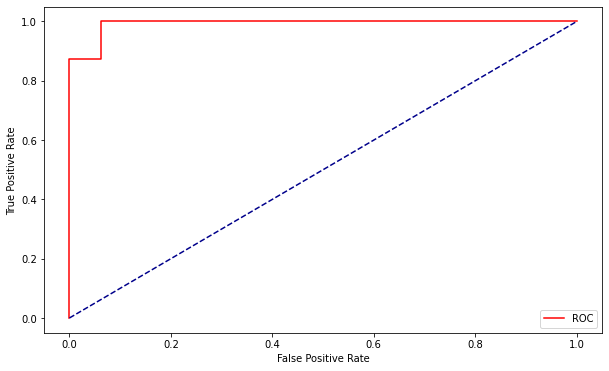

In [245]:

fpr, tpr, thresholds = roc_curve(y_test, pred_prob1[:,1])
 
#Plotting the figure
plt.figure(figsize = (10,6))
plt.plot(fpr, tpr, color='red', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('')
plt.legend()
plt.show()

In [268]:
column = df.columns
column
input_column = ['bp (Diastolic)', 'bp limit', 'sg', 'al', 'rbc', 'su', 'pc', 'pcc',
       'ba', 'bgr', 'bu', 'sod', 'sc', 'pot', 'hemo', 'pcv', 'rbcc', 'wbcc',
       'htn', 'dm', 'cad', 'appet', 'pe', 'ane', 'grf', 'stage', 'age']
output_column = ['class']

In [270]:
# pip install shap

     |████████████████████████████████| 453 kB 1.5 MB/s eta 0:00:01
You should consider upgrading via the '/Users/parama/Work/workenv/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


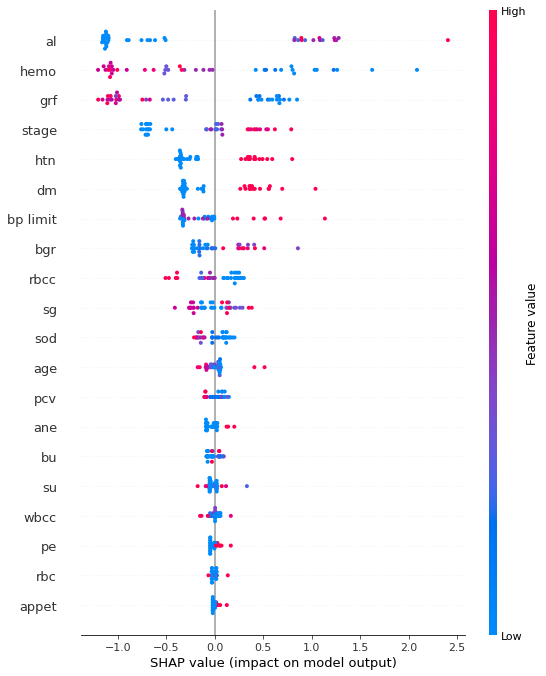

In [271]:
import catboost
import shap
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split


# Explain the model using SHAP values
explainer = shap.Explainer(catboost_model)
shap_values = explainer.shap_values(X_test)

# Visualize the SHAP summary plot
shap.summary_plot(shap_values, X_test, feature_names=input_column, class_names=output_column)


In [89]:
X_train, X_test, y_train, y_test = train_test_split(inputs,target,random_state=0, test_size=0.2)
X_train = X_train.to_numpy()
y_train = y_train.to_numpy().squeeze()
X_test  = X_test.to_numpy()

In [ ]:
import optuna
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_digits

# Load a sample dataset (digits dataset from scikit-learn)
digits = load_digits()
X, y = digits.data, digits.target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

def objective(trial):
    # Define hyperparameters to optimize
    n_a = trial.suggest_int('n_a', 8, 64)
    n_d = trial.suggest_int('n_d', 8, 64)
    n_steps = trial.suggest_int('n_steps', 3, 10)
    gamma = trial.suggest_float('gamma', 1.0, 2.0)
    lambda_sparse = trial.suggest_float('lambda_sparse', 0.000001, 0.01)

    # Create TabNet classifier with suggested hyperparameters
    tabnet_classifier = TabNetClassifier(
        n_a=n_a,
        n_d=n_d,
        n_steps=n_steps,
        gamma=gamma,
        lambda_sparse=lambda_sparse,
        optimizer_params=dict(lr=2e-2),
        scheduler_params=dict(max_lr=0.05, steps_per_epoch=200, epochs=10),
        verbose=0
    )

    # Train the model
    tabnet_classifier.fit(X_train, y_train, eval_set=[(X_test, y_test)], patience=10)

    # Make predictions on the validation set
    y_pred = tabnet_classifier.predict(X_test)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)

    return 1.0 - accuracy  # Optuna minimizes the objective function, so use 1 - accuracy

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters
best_params = study.best_params
print(f"Best Hyperparameters: {best_params}")

# Create TabNet classifier with best hyperparameters
best_tabnet_classifier = TabNetClassifier(**best_params)
best_tabnet_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = best_tabnet_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy with Best Hyperparameters: {accuracy:.4f}")


[I 2024-02-24 02:39:47,459] A new study created in memory with name: no-name-093e6839-b6f3-43c1-ae3a-7206880a7978


In [13]:
df_ckd = df[df['class']==1]
df_ckd

,bp (Diastolic),bp limit,sg,al,rbc,su,pc,pcc,ba,bgr,...,htn,dm,cad,appet,pe,ane,grf,stage,age,class
0,0,0,0,3,0,0,0,0,0,1,...,0,0,0,0,0,0,9,0,8,1
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,9,0,8,1
2,0,0,1,4,1,0,1,0,1,1,...,0,0,0,1,0,0,5,0,8,1
3,1,1,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,5,0,8,1
4,0,0,3,0,0,0,0,0,0,3,...,0,1,0,1,1,0,5,0,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,0,0,3,3,0,0,0,0,0,1,...,1,0,0,0,0,0,1,4,7,1
194,0,0,3,1,0,0,1,1,0,2,...,1,0,0,1,1,1,0,3,7,1
195,1,2,0,0,0,0,0,0,0,3,...,1,1,0,0,0,1,1,4,7,1
196,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,7,1


In [14]:
df_nonckd = df[df['class']==0]
df_nonckd

,bp (Diastolic),bp limit,sg,al,rbc,su,pc,pcc,ba,bgr,...,htn,dm,cad,appet,pe,ane,grf,stage,age,class
5,1,1,2,0,0,0,0,0,0,1,...,0,0,0,0,0,0,4,0,9,0
8,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,6,0
10,0,0,2,0,0,0,0,0,0,1,...,0,0,0,0,0,0,3,2,6,0
11,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,6,0,6,0
12,1,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,3,0,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,6,0,1,0
188,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,5,0,1,0
191,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,4,0,7,0
197,1,1,2,0,0,0,0,0,0,1,...,0,0,0,0,0,0,2,2,7,0


In [15]:
list(df.columns)

['bp (Diastolic)',
 'bp limit',
 'sg',
 'al',
 'rbc',
 'su',
 'pc',
 'pcc',
 'ba',
 'bgr',
 'bu',
 'sod',
 'sc',
 'pot',
 'hemo',
 'pcv',
 'rbcc',
 'wbcc',
 'htn',
 'dm',
 'cad',
 'appet',
 'pe',
 'ane',
 'grf',
 'stage',
 'age',
 'class']

In [264]:
# Importing library
from scipy.stats import f_oneway
from scipy.stats import ttest_ind

columns= ['bp (Diastolic)',
 'bp limit',
 'sg',
 'al',
 'rbc',
 'su',
 'pc',
 'pcc',
 'ba',
 'bgr',
 'bu',
 'sod',
 'sc',
 'pot',
 'hemo',
 'pcv',
 'rbcc',
 'wbcc',
 'htn',
 'dm',
 'cad',
 'appet',
 'pe',
 'ane',
 'grf',
 'stage',
 'age']

# Conduct the one-way ANOVA
for i in columns:
    #print (i)
    list_ckd = list(df_ckd[i])
    list_nonckd = list(df_nonckd[i])
    print('T-test for', i)
    
    statistic, p_value = ttest_ind(list_ckd, list_nonckd)
    print('statistic:',round(statistic,4), 'p_value:', round(p_value, 4))
    if p_value < 0.05:
        print('Significance difference found for:', i)
    else: 
        print('Significance difference NOT found for:', i)
    if statistic > 0:
        print('The mean of ckd is greater than the mean of non_ckd.')
    elif statistic < 0:
        print('The mean of non_ckd is greater than the mean of ckd.')
    else:
        print('There is no significant difference in means.')
    print('\n')
 


T-test for bp (Diastolic)
statistic: 1.4427 p_value: 0.1507
Significance difference NOT found for: bp (Diastolic)
The mean of ckd is greater than the mean of non_ckd.


T-test for bp limit
statistic: 4.0573 p_value: 0.0001
Significance difference found for: bp limit
The mean of ckd is greater than the mean of non_ckd.


T-test for sg
statistic: 2.3949 p_value: 0.0176
Significance difference found for: sg
The mean of ckd is greater than the mean of non_ckd.


T-test for al
statistic: 9.0582 p_value: 0.0
Significance difference found for: al
The mean of ckd is greater than the mean of non_ckd.


T-test for rbc
statistic: 4.1594 p_value: 0.0
Significance difference found for: rbc
The mean of ckd is greater than the mean of non_ckd.


T-test for su
statistic: 4.0558 p_value: 0.0001
Significance difference found for: su
The mean of ckd is greater than the mean of non_ckd.


T-test for pc
statistic: 6.2166 p_value: 0.0
Significance difference found for: pc
The mean of ckd is greater than the